# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](https://github.com/Ganitk/DL_ex3/blob/master/gan_outputs_tf.png?raw=1)


## Setup

In [2]:
from google.colab import drive
import os
drive.mount('/content/drive', force_remount=True)
# os.chdir('/content/drive/My Drive/DL/ex3/cs231n/datasets')
# !bash get_coco_captioning.sh
# !bash get_imagenet_val.sh
# !bash get_squeezenet_tf.sh
os.chdir('/content/drive/My Drive/DL/ex3/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
!pip install scipy==1.1.0

     |████████████████████████████████| 31.2MB 93kB/s 
ERROR: tensorflow 2.2.0rc3 has requirement scipy==1.4.1; python_version >= "3", but you'll have scipy 1.1.0 which is incompatible.
ERROR: plotnine 0.6.0 has requirement scipy>=1.2.0, but you'll have scipy 1.1.0 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1


In [0]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 0s 0us/step


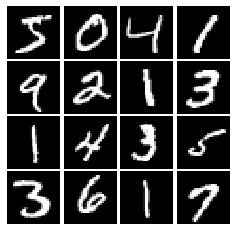

In [6]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [0]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha*x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [8]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [0]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform((batch_size,dim), minval=-1, maxval=1)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [10]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
      
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(1, activation=None),


        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    model.build((None, 784))

    return model

Test to make sure the number of parameters in the discriminator is correct:

In [12]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        
        tf.keras.layers.Dense(1024, activation=tf.nn.relu),
        tf.keras.layers.Dense(1024, activation=tf.nn.relu),
        tf.keras.layers.Dense(784, activation=tf.nn.tanh),


        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    model.build((None,noise_dim))
    return model

Test to make sure the number of parameters in the generator is correct:

In [14]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(tf.ones(tf.shape(logits_real)), logits_real)
    
    loss +=  bce(tf.zeros(tf.shape(logits_fake)), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    loss = bce(tf.ones(tf.shape(logits_fake)), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [16]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [17]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [0]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)
    G_solver = tf.optimizers.Adam(learning_rate=1e-3, beta_1=0.5)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [0]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.436, G:0.7364
Instructions for updating:
Use tf.identity instead.


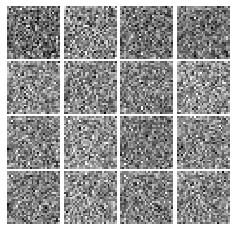

Epoch: 0, Iter: 20, D: 0.6144, G:0.8925


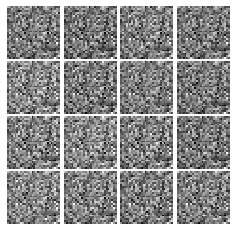

Epoch: 0, Iter: 40, D: 0.4489, G:1.092


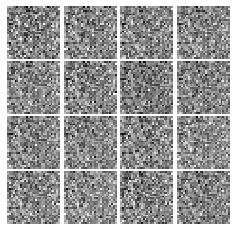

Epoch: 0, Iter: 60, D: 0.3941, G:2.66


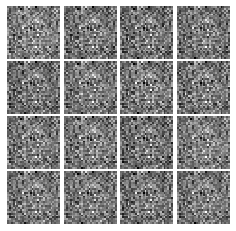

Epoch: 0, Iter: 80, D: 1.253, G:1.245


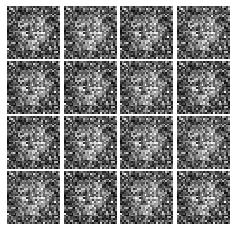

Epoch: 0, Iter: 100, D: 1.27, G:1.245


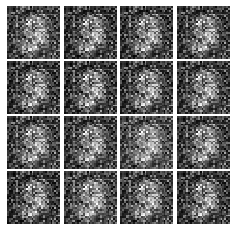

Epoch: 0, Iter: 120, D: 1.345, G:1.775


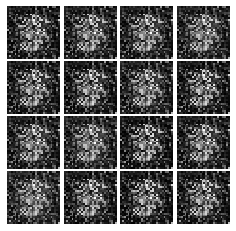

Epoch: 0, Iter: 140, D: 1.196, G:2.247


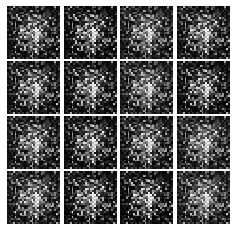

Epoch: 0, Iter: 160, D: 2.152, G:1.179


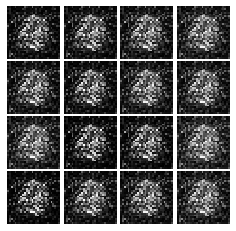

Epoch: 0, Iter: 180, D: 2.025, G:0.7741


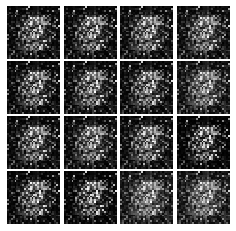

Epoch: 0, Iter: 200, D: 1.087, G:1.887


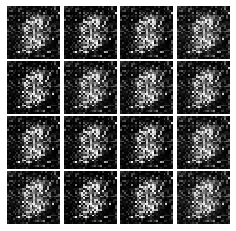

Epoch: 0, Iter: 220, D: 1.137, G:1.364


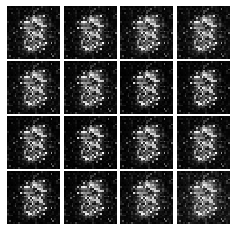

Epoch: 0, Iter: 240, D: 1.037, G:1.656


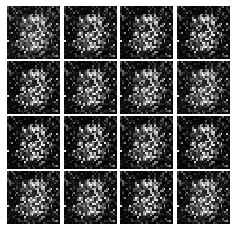

Epoch: 0, Iter: 260, D: 1.535, G:1.129


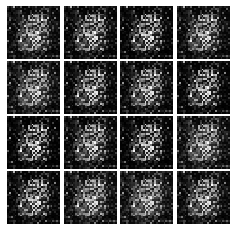

Epoch: 0, Iter: 280, D: 1.058, G:1.685


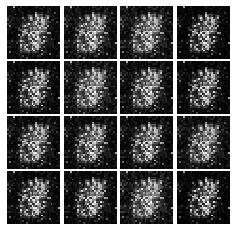

Epoch: 0, Iter: 300, D: 0.864, G:1.842


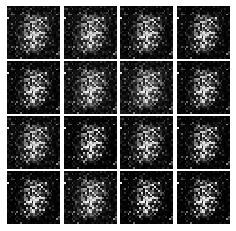

Epoch: 0, Iter: 320, D: 0.7316, G:1.891


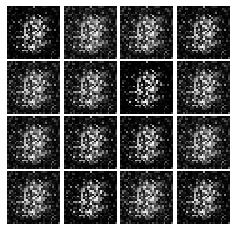

Epoch: 0, Iter: 340, D: 0.9228, G:1.847


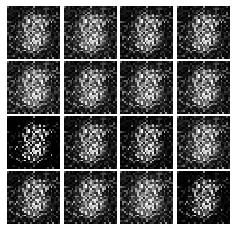

Epoch: 0, Iter: 360, D: 1.264, G:1.795


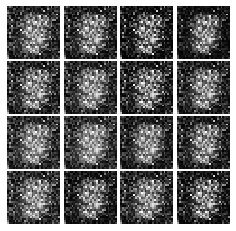

Epoch: 0, Iter: 380, D: 1.335, G:1.496


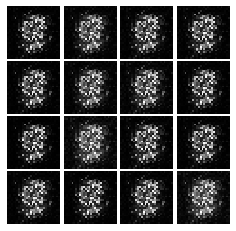

Epoch: 0, Iter: 400, D: 0.847, G:1.673


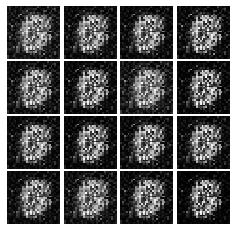

Epoch: 0, Iter: 420, D: 1.153, G:1.066


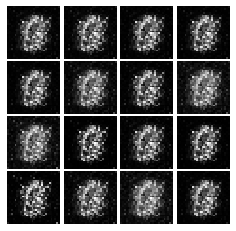

Epoch: 0, Iter: 440, D: 0.8899, G:1.866


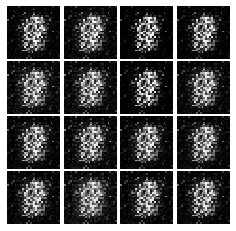

Epoch: 0, Iter: 460, D: 1.438, G:1.179


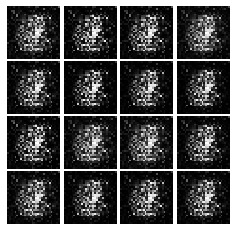

Epoch: 1, Iter: 480, D: 1.385, G:1.134


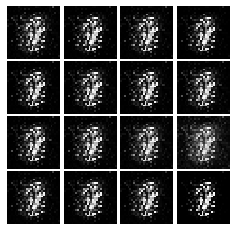

Epoch: 1, Iter: 500, D: 0.7366, G:1.397


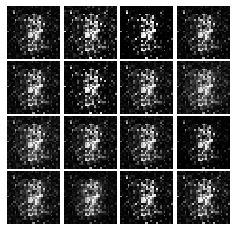

Epoch: 1, Iter: 520, D: 0.7154, G:1.673


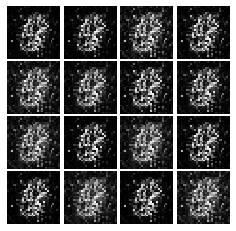

Epoch: 1, Iter: 540, D: 1.161, G:1.181


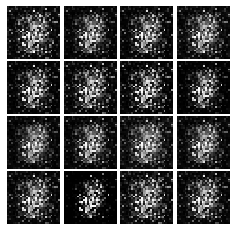

Epoch: 1, Iter: 560, D: 1.209, G:1.117


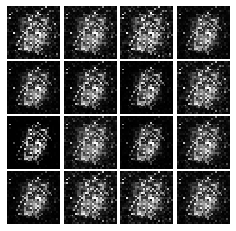

Epoch: 1, Iter: 580, D: 0.9885, G:1.523


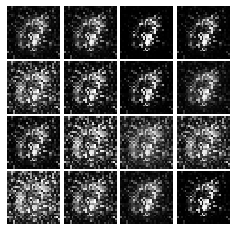

Epoch: 1, Iter: 600, D: 1.576, G:2.159


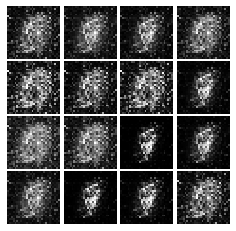

Epoch: 1, Iter: 620, D: 1.025, G:1.814


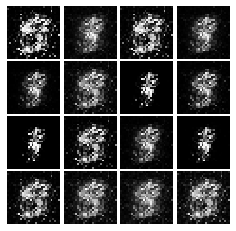

Epoch: 1, Iter: 640, D: 1.09, G:1.151


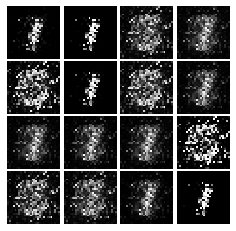

Epoch: 1, Iter: 660, D: 1.199, G:1.104


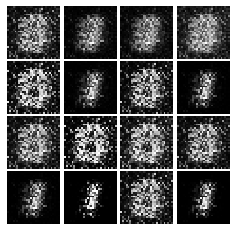

Epoch: 1, Iter: 680, D: 0.8708, G:1.201


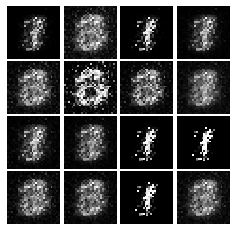

Epoch: 1, Iter: 700, D: 1.046, G:1.368


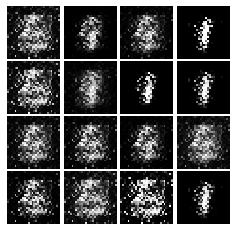

Epoch: 1, Iter: 720, D: 1.826, G:0.4078


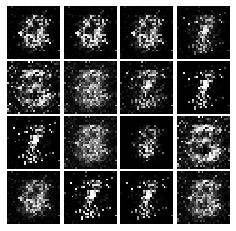

Epoch: 1, Iter: 740, D: 1.277, G:1.157


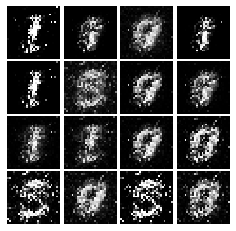

Epoch: 1, Iter: 760, D: 1.265, G:1.081


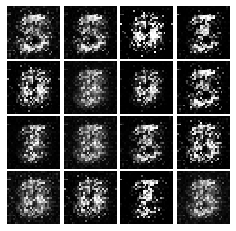

Epoch: 1, Iter: 780, D: 1.373, G:0.8277


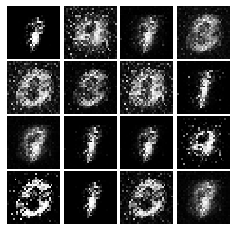

Epoch: 1, Iter: 800, D: 1.175, G:0.8981


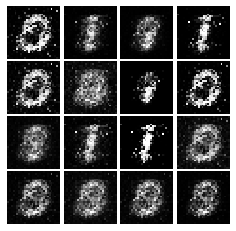

Epoch: 1, Iter: 820, D: 1.316, G:1.035


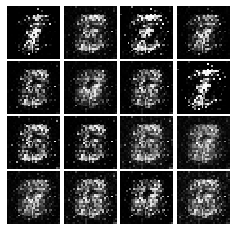

Epoch: 1, Iter: 840, D: 1.268, G:1.031


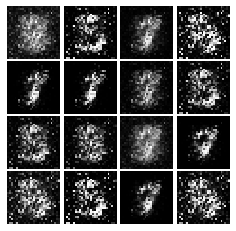

Epoch: 1, Iter: 860, D: 1.051, G:1.204


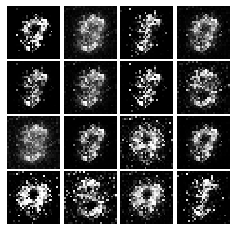

Epoch: 1, Iter: 880, D: 1.295, G:1.133


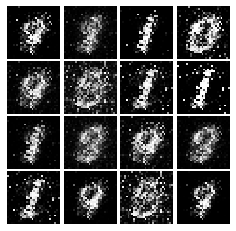

Epoch: 1, Iter: 900, D: 1.32, G:1.002


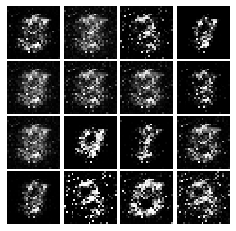

Epoch: 1, Iter: 920, D: 1.537, G:1.057


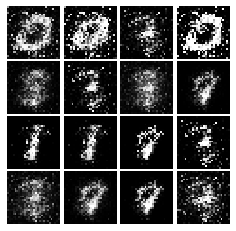

Epoch: 2, Iter: 940, D: 1.066, G:1.312


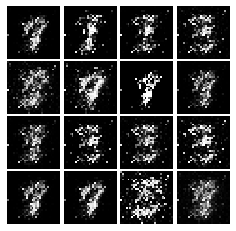

Epoch: 2, Iter: 960, D: 1.02, G:1.268


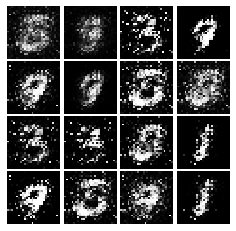

Epoch: 2, Iter: 980, D: 1.134, G:1.413


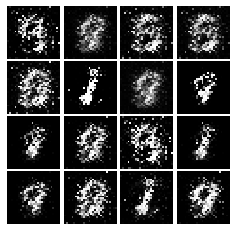

Epoch: 2, Iter: 1000, D: 1.305, G:1.175


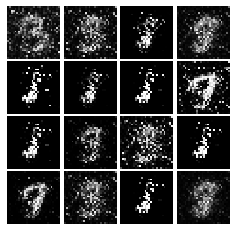

Epoch: 2, Iter: 1020, D: 1.113, G:1.573


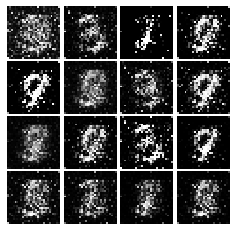

Epoch: 2, Iter: 1040, D: 1.006, G:1.601


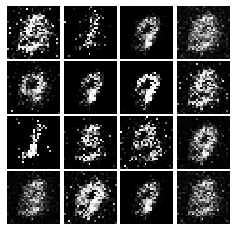

Epoch: 2, Iter: 1060, D: 1.333, G:0.5087


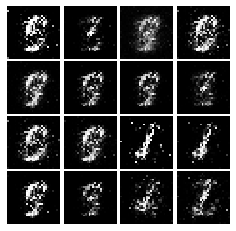

Epoch: 2, Iter: 1080, D: 1.073, G:1.883


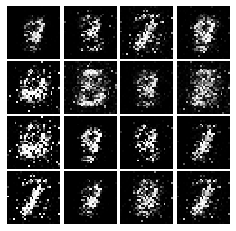

Epoch: 2, Iter: 1100, D: 1.399, G:0.6203


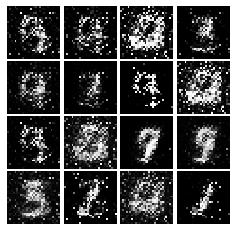

Epoch: 2, Iter: 1120, D: 1.134, G:1.123


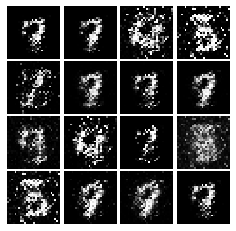

Epoch: 2, Iter: 1140, D: 0.9442, G:2.165


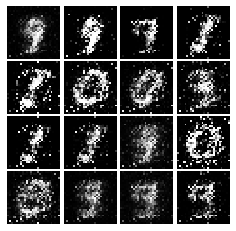

Epoch: 2, Iter: 1160, D: 1.199, G:1.212


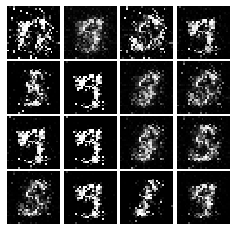

Epoch: 2, Iter: 1180, D: 1.112, G:2.116


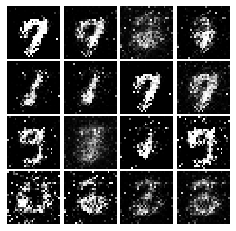

Epoch: 2, Iter: 1200, D: 1.166, G:1.184


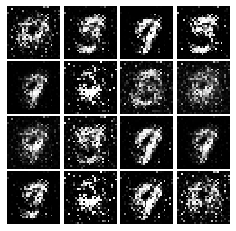

Epoch: 2, Iter: 1220, D: 1.482, G:0.914


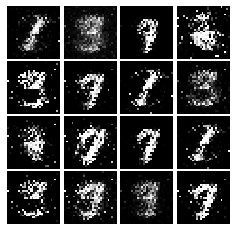

Epoch: 2, Iter: 1240, D: 1.26, G:1.146


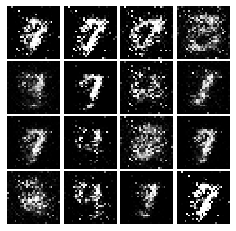

Epoch: 2, Iter: 1260, D: 1.442, G:0.3909


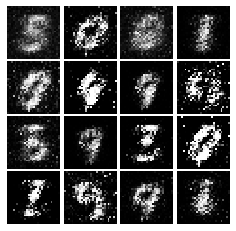

Epoch: 2, Iter: 1280, D: 1.221, G:0.954


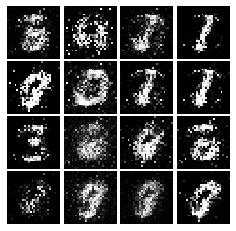

Epoch: 2, Iter: 1300, D: 1.323, G:0.9718


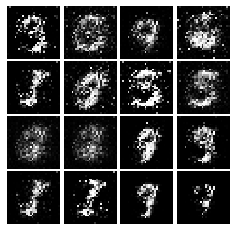

Epoch: 2, Iter: 1320, D: 1.233, G:0.986


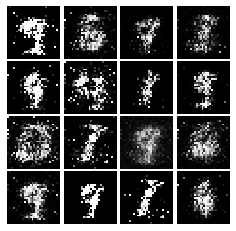

Epoch: 2, Iter: 1340, D: 1.186, G:1.014


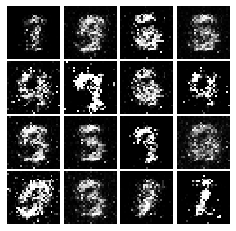

Epoch: 2, Iter: 1360, D: 1.227, G:1.025


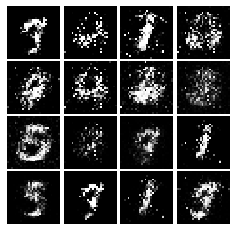

Epoch: 2, Iter: 1380, D: 1.291, G:0.8853


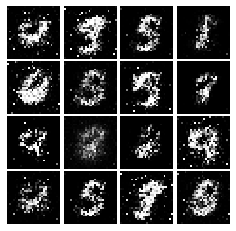

Epoch: 2, Iter: 1400, D: 1.058, G:0.8013


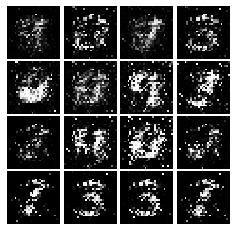

Epoch: 3, Iter: 1420, D: 1.309, G:1.009


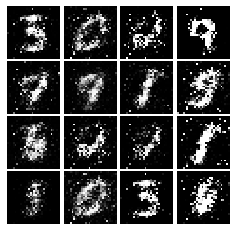

Epoch: 3, Iter: 1440, D: 1.257, G:1.222


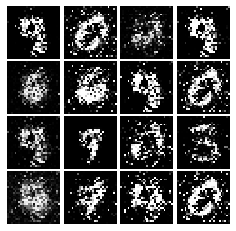

Epoch: 3, Iter: 1460, D: 1.027, G:0.7934


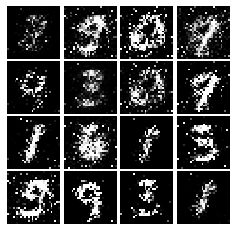

Epoch: 3, Iter: 1480, D: 1.138, G:0.9894


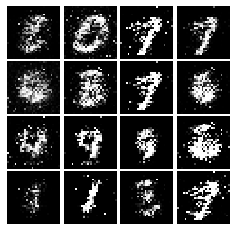

Epoch: 3, Iter: 1500, D: 1.306, G:1.233


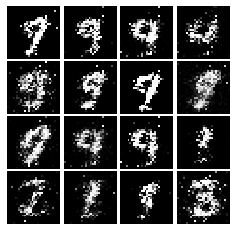

Epoch: 3, Iter: 1520, D: 1.337, G:0.9907


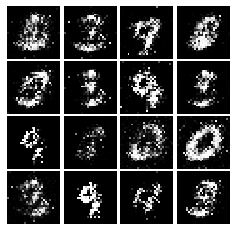

Epoch: 3, Iter: 1540, D: 1.168, G:0.9855


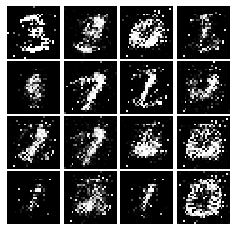

Epoch: 3, Iter: 1560, D: 1.19, G:1.002


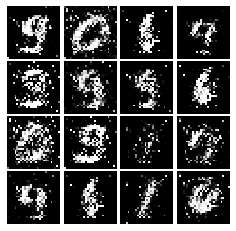

Epoch: 3, Iter: 1580, D: 1.503, G:0.8147


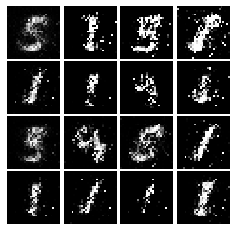

Epoch: 3, Iter: 1600, D: 1.328, G:0.2729


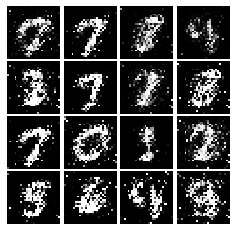

Epoch: 3, Iter: 1620, D: 1.2, G:1.798


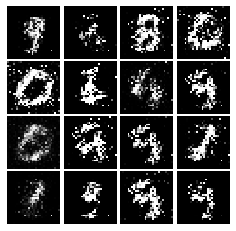

Epoch: 3, Iter: 1640, D: 1.094, G:1.239


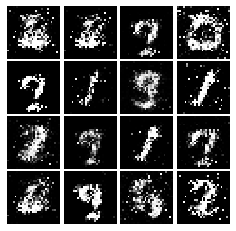

Epoch: 3, Iter: 1660, D: 0.9765, G:1.519


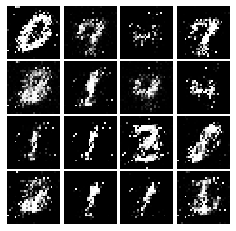

Epoch: 3, Iter: 1680, D: 1.027, G:1.232


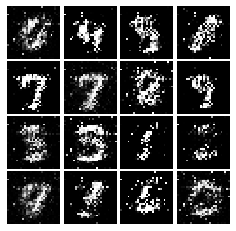

Epoch: 3, Iter: 1700, D: 1.054, G:1.265


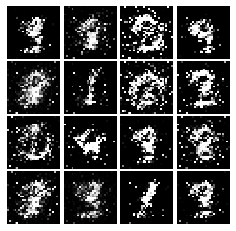

Epoch: 3, Iter: 1720, D: 1.194, G:1.085


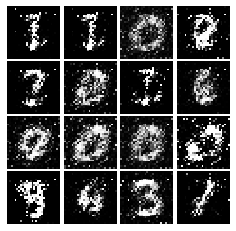

Epoch: 3, Iter: 1740, D: 1.089, G:1.177


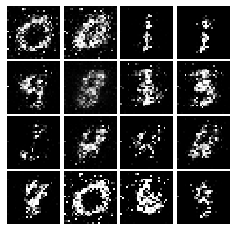

Epoch: 3, Iter: 1760, D: 1.075, G:1.408


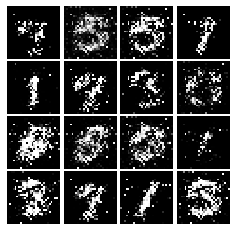

Epoch: 3, Iter: 1780, D: 1.188, G:1.152


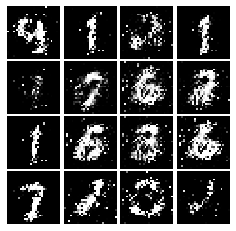

Epoch: 3, Iter: 1800, D: 1.212, G:0.9174


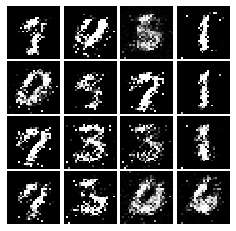

Epoch: 3, Iter: 1820, D: 1.207, G:0.96


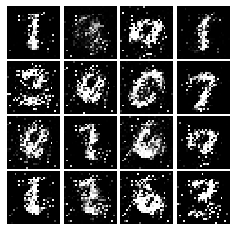

Epoch: 3, Iter: 1840, D: 0.9913, G:1.241


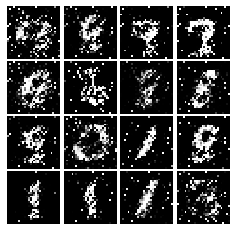

Epoch: 3, Iter: 1860, D: 1.398, G:1.6


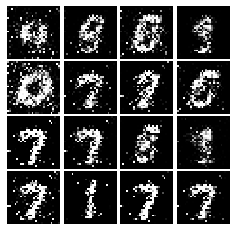

Epoch: 4, Iter: 1880, D: 1.072, G:1.256


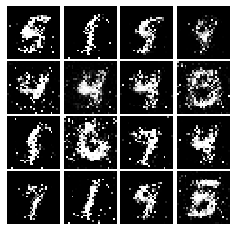

Epoch: 4, Iter: 1900, D: 1.16, G:1.115


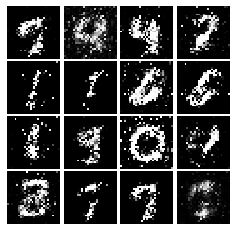

Epoch: 4, Iter: 1920, D: 1.246, G:1.013


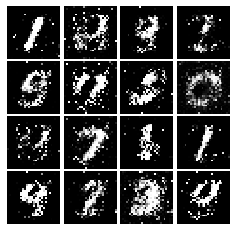

Epoch: 4, Iter: 1940, D: 1.222, G:0.839


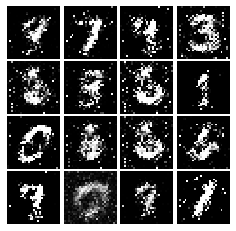

Epoch: 4, Iter: 1960, D: 1.394, G:0.9829


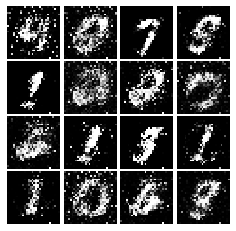

Epoch: 4, Iter: 1980, D: 1.16, G:1.046


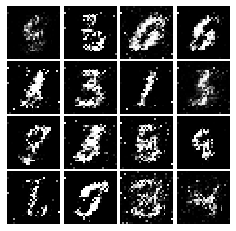

Epoch: 4, Iter: 2000, D: 1.231, G:1.178


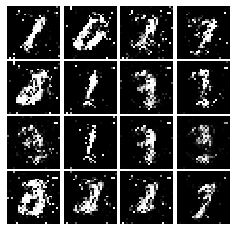

Epoch: 4, Iter: 2020, D: 1.139, G:1.007


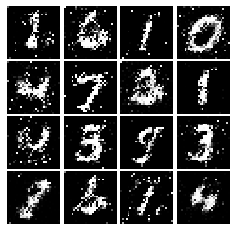

Epoch: 4, Iter: 2040, D: 1.317, G:1.101


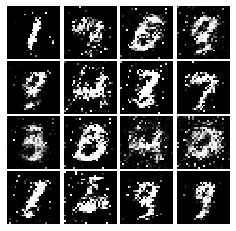

Epoch: 4, Iter: 2060, D: 1.326, G:1.13


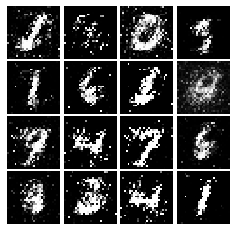

Epoch: 4, Iter: 2080, D: 1.124, G:0.9955


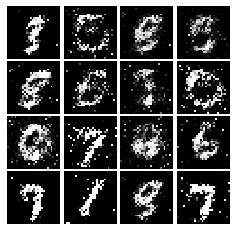

Epoch: 4, Iter: 2100, D: 1.195, G:1.095


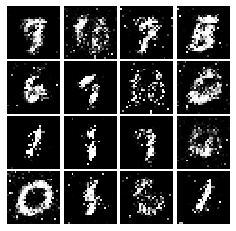

Epoch: 4, Iter: 2120, D: 1.225, G:0.9394


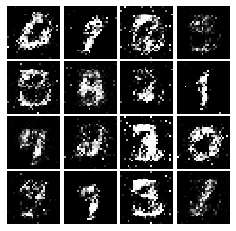

Epoch: 4, Iter: 2140, D: 1.356, G:0.9456


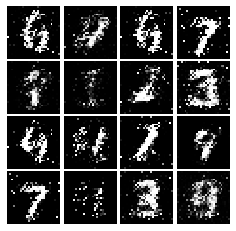

Epoch: 4, Iter: 2160, D: 1.409, G:0.9853


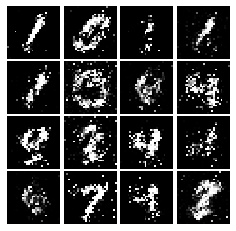

Epoch: 4, Iter: 2180, D: 1.282, G:0.8949


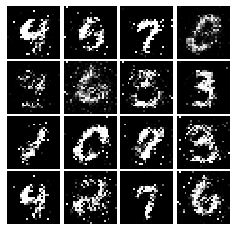

Epoch: 4, Iter: 2200, D: 1.283, G:0.9404


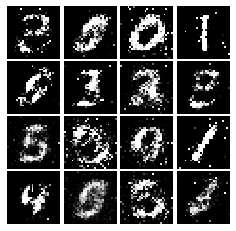

Epoch: 4, Iter: 2220, D: 1.257, G:0.8711


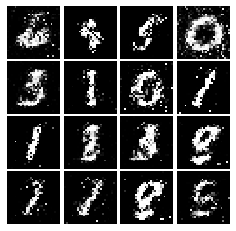

Epoch: 4, Iter: 2240, D: 1.311, G:0.8939


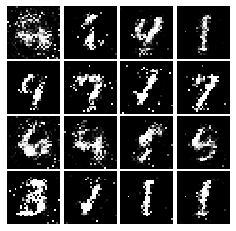

Epoch: 4, Iter: 2260, D: 1.179, G:1.065


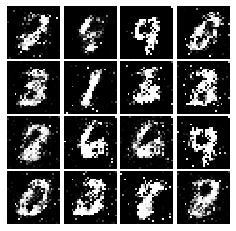

Epoch: 4, Iter: 2280, D: 1.272, G:0.8688


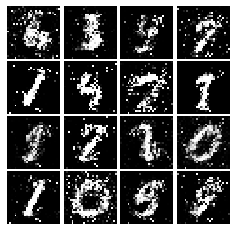

Epoch: 4, Iter: 2300, D: 1.293, G:0.8585


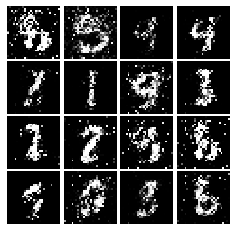

Epoch: 4, Iter: 2320, D: 1.247, G:1.074


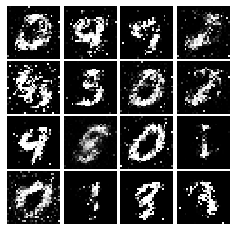

Epoch: 4, Iter: 2340, D: 1.628, G:0.5566


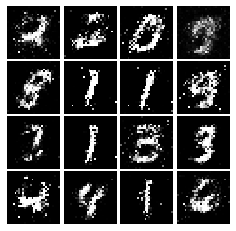

Epoch: 5, Iter: 2360, D: 1.124, G:0.9949


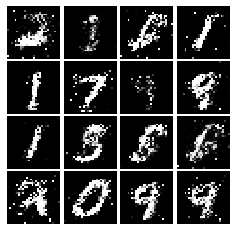

Epoch: 5, Iter: 2380, D: 1.338, G:0.8854


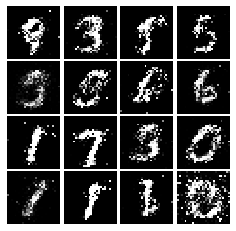

Epoch: 5, Iter: 2400, D: 1.238, G:1.065


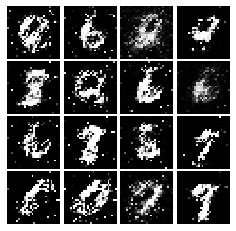

Epoch: 5, Iter: 2420, D: 1.319, G:0.8151


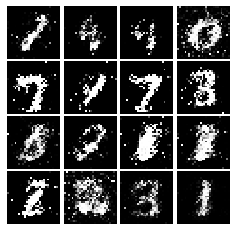

Epoch: 5, Iter: 2440, D: 1.27, G:0.8826


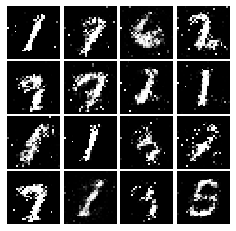

Epoch: 5, Iter: 2460, D: 1.33, G:1.018


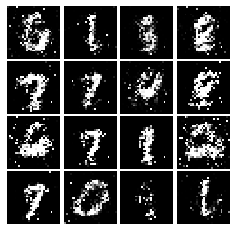

Epoch: 5, Iter: 2480, D: 1.425, G:1.009


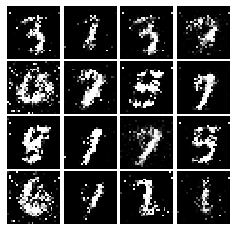

Epoch: 5, Iter: 2500, D: 1.13, G:1.082


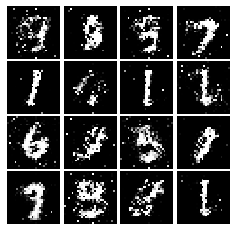

Epoch: 5, Iter: 2520, D: 1.305, G:0.9001


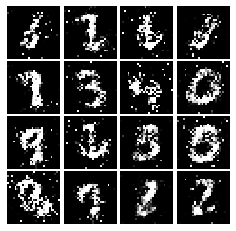

Epoch: 5, Iter: 2540, D: 1.322, G:0.8428


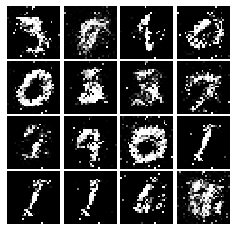

Epoch: 5, Iter: 2560, D: 1.347, G:0.852


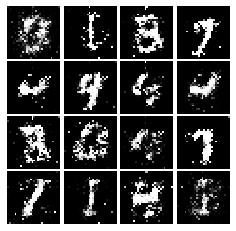

Epoch: 5, Iter: 2580, D: 1.256, G:0.7309


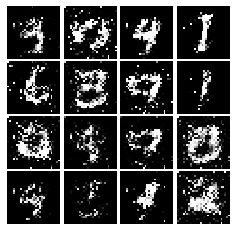

Epoch: 5, Iter: 2600, D: 1.341, G:0.7568


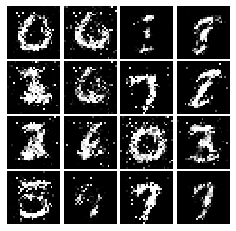

Epoch: 5, Iter: 2620, D: 1.157, G:0.972


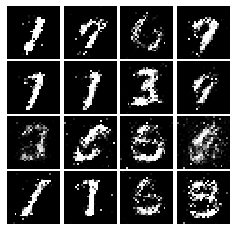

Epoch: 5, Iter: 2640, D: 1.276, G:0.9252


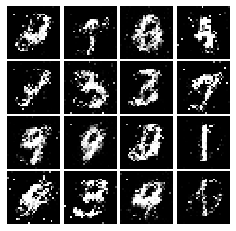

Epoch: 5, Iter: 2660, D: 1.245, G:0.9425


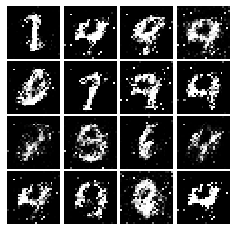

Epoch: 5, Iter: 2680, D: 1.445, G:0.899


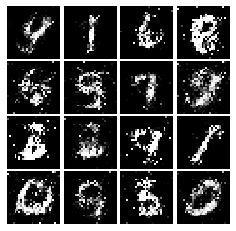

Epoch: 5, Iter: 2700, D: 1.27, G:0.8103


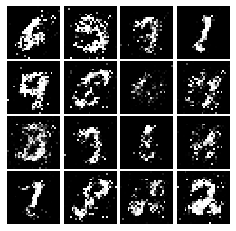

Epoch: 5, Iter: 2720, D: 1.416, G:0.9547


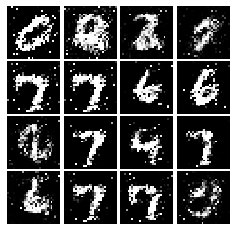

Epoch: 5, Iter: 2740, D: 1.272, G:0.9571


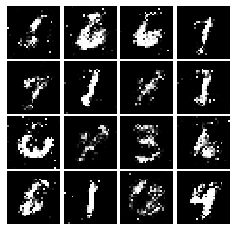

Epoch: 5, Iter: 2760, D: 1.265, G:0.8928


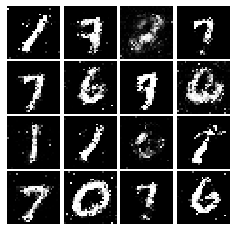

Epoch: 5, Iter: 2780, D: 1.241, G:0.8638


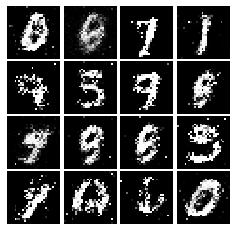

Epoch: 5, Iter: 2800, D: 1.412, G:0.7318


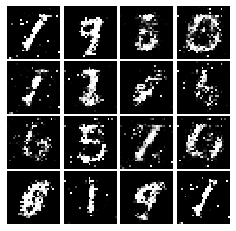

Epoch: 6, Iter: 2820, D: 1.35, G:0.4334


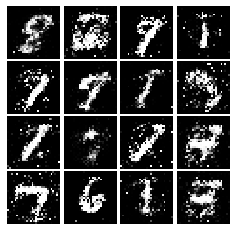

Epoch: 6, Iter: 2840, D: 1.388, G:0.8282


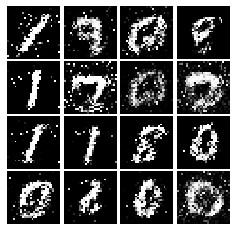

Epoch: 6, Iter: 2860, D: 1.268, G:0.9992


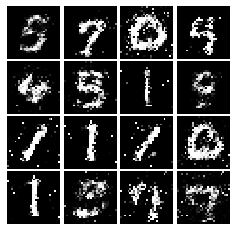

Epoch: 6, Iter: 2880, D: 1.115, G:0.9367


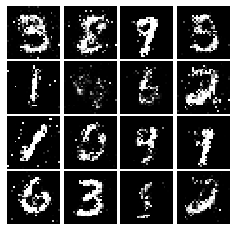

Epoch: 6, Iter: 2900, D: 1.388, G:0.7337


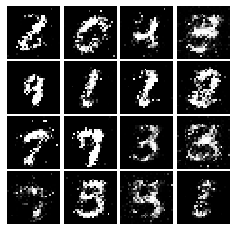

Epoch: 6, Iter: 2920, D: 1.392, G:0.8258


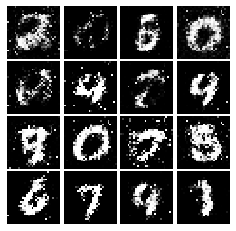

Epoch: 6, Iter: 2940, D: 1.229, G:0.8058


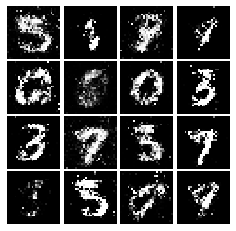

Epoch: 6, Iter: 2960, D: 1.32, G:0.7832


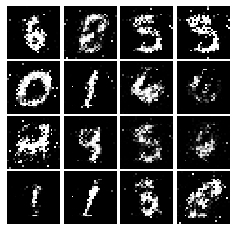

Epoch: 6, Iter: 2980, D: 1.413, G:0.7457


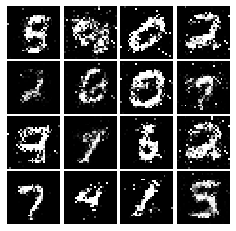

Epoch: 6, Iter: 3000, D: 1.294, G:0.7506


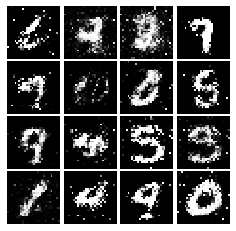

Epoch: 6, Iter: 3020, D: 1.305, G:0.9497


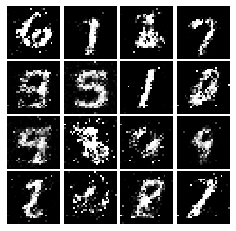

Epoch: 6, Iter: 3040, D: 1.326, G:0.8414


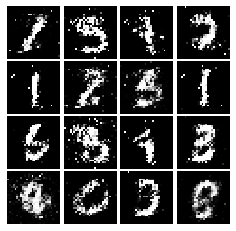

Epoch: 6, Iter: 3060, D: 1.314, G:0.8822


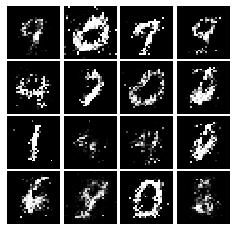

Epoch: 6, Iter: 3080, D: 1.262, G:0.8892


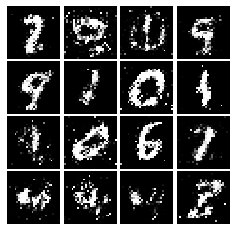

Epoch: 6, Iter: 3100, D: 1.354, G:0.7632


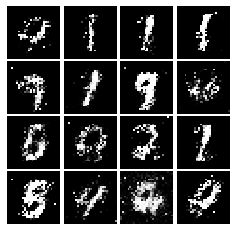

Epoch: 6, Iter: 3120, D: 1.504, G:0.7668


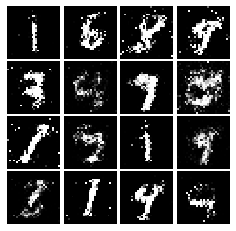

Epoch: 6, Iter: 3140, D: 1.423, G:0.8427


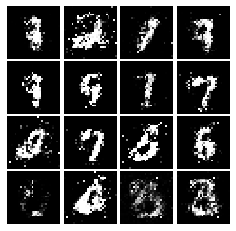

Epoch: 6, Iter: 3160, D: 1.262, G:0.7143


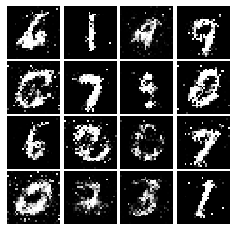

Epoch: 6, Iter: 3180, D: 1.317, G:0.7642


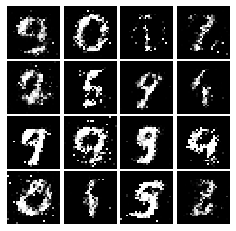

Epoch: 6, Iter: 3200, D: 1.428, G:0.8825


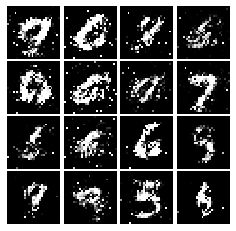

Epoch: 6, Iter: 3220, D: 1.235, G:0.9671


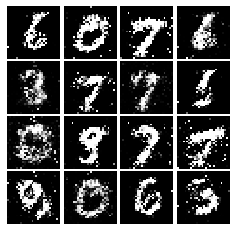

Epoch: 6, Iter: 3240, D: 1.202, G:0.988


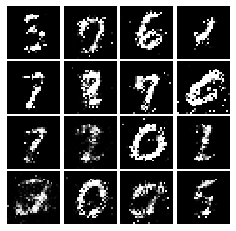

Epoch: 6, Iter: 3260, D: 1.37, G:0.8579


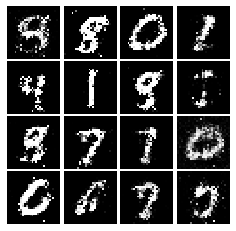

Epoch: 6, Iter: 3280, D: 1.306, G:0.7542


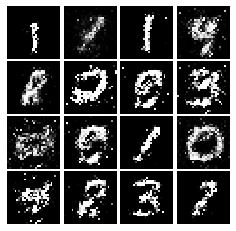

Epoch: 7, Iter: 3300, D: 1.241, G:0.7738


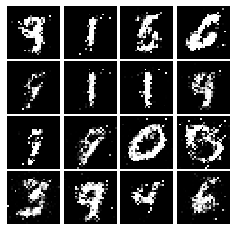

Epoch: 7, Iter: 3320, D: 1.318, G:0.87


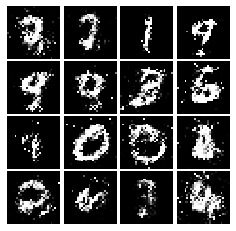

Epoch: 7, Iter: 3340, D: 1.287, G:1.392


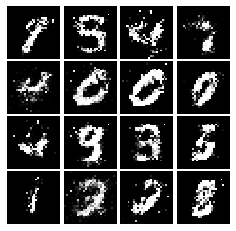

Epoch: 7, Iter: 3360, D: 1.373, G:0.8279


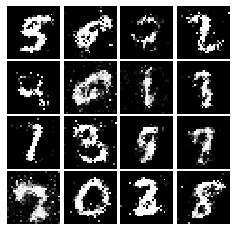

Epoch: 7, Iter: 3380, D: 1.358, G:0.7458


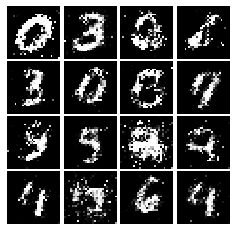

Epoch: 7, Iter: 3400, D: 1.369, G:0.8045


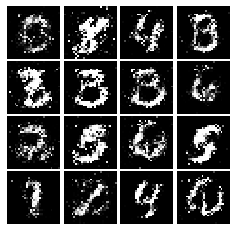

Epoch: 7, Iter: 3420, D: 1.376, G:0.7806


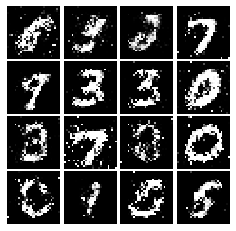

Epoch: 7, Iter: 3440, D: 1.315, G:0.8186


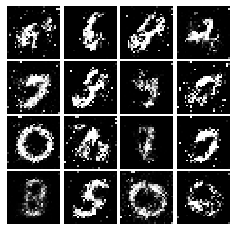

Epoch: 7, Iter: 3460, D: 1.365, G:0.7926


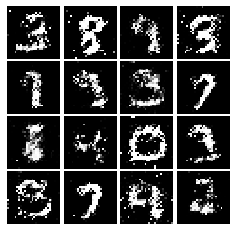

Epoch: 7, Iter: 3480, D: 1.346, G:0.755


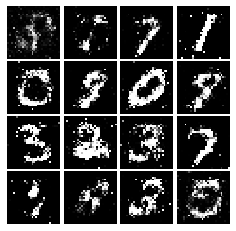

Epoch: 7, Iter: 3500, D: 1.38, G:0.8829


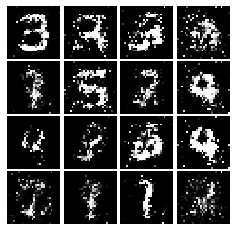

Epoch: 7, Iter: 3520, D: 1.312, G:1.007


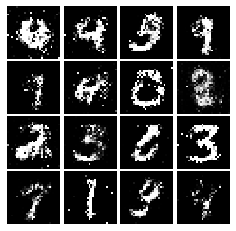

Epoch: 7, Iter: 3540, D: 1.331, G:0.7887


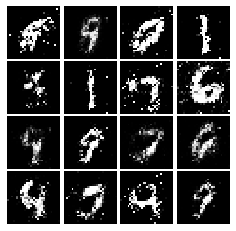

Epoch: 7, Iter: 3560, D: 1.326, G:0.7255


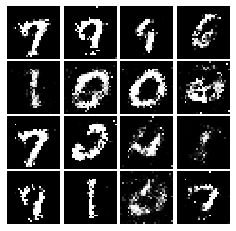

Epoch: 7, Iter: 3580, D: 1.403, G:0.7939


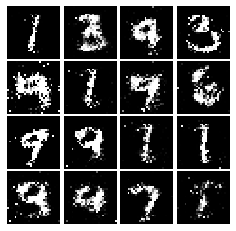

Epoch: 7, Iter: 3600, D: 1.355, G:0.7399


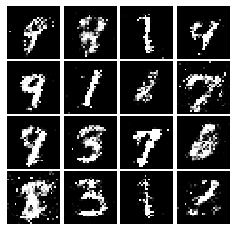

Epoch: 7, Iter: 3620, D: 1.356, G:0.7612


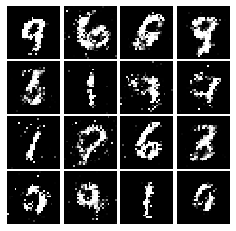

Epoch: 7, Iter: 3640, D: 1.369, G:0.8172


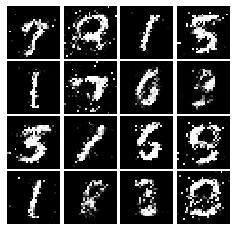

Epoch: 7, Iter: 3660, D: 1.364, G:0.72


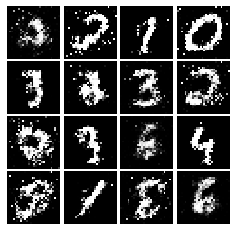

Epoch: 7, Iter: 3680, D: 1.398, G:0.8408


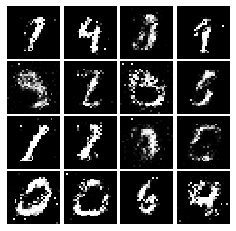

Epoch: 7, Iter: 3700, D: 1.321, G:0.723


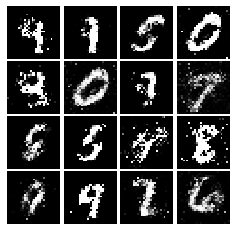

Epoch: 7, Iter: 3720, D: 1.33, G:0.7641


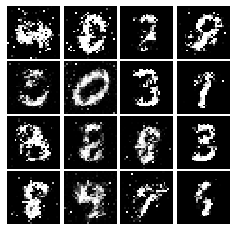

Epoch: 7, Iter: 3740, D: 1.366, G:0.7047


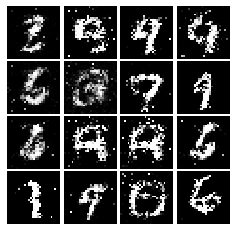

Epoch: 8, Iter: 3760, D: 1.386, G:0.8469


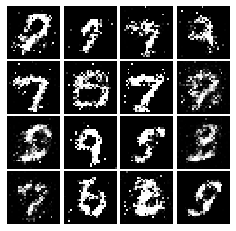

Epoch: 8, Iter: 3780, D: 1.421, G:0.7609


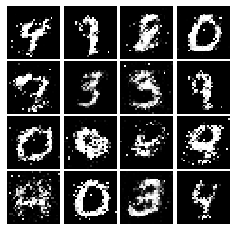

Epoch: 8, Iter: 3800, D: 1.377, G:0.8127


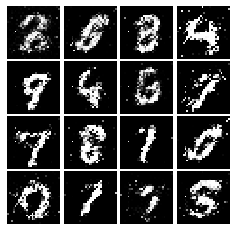

Epoch: 8, Iter: 3820, D: 1.291, G:0.7474


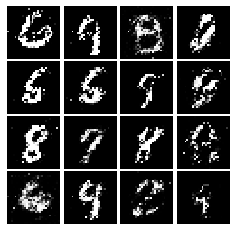

Epoch: 8, Iter: 3840, D: 1.387, G:0.8203


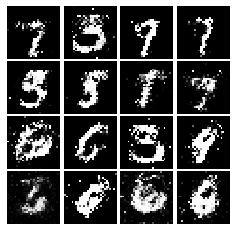

Epoch: 8, Iter: 3860, D: 1.329, G:0.7427


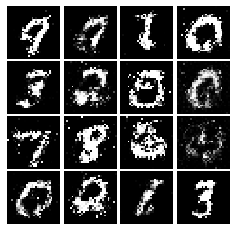

Epoch: 8, Iter: 3880, D: 1.38, G:0.7855


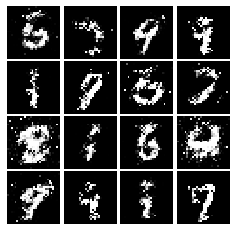

Epoch: 8, Iter: 3900, D: 1.382, G:0.6664


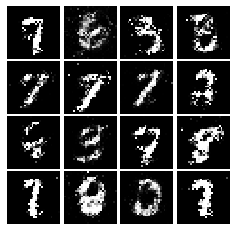

Epoch: 8, Iter: 3920, D: 1.352, G:0.721


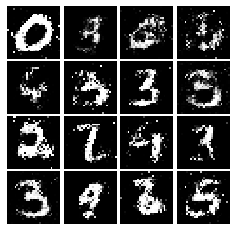

Epoch: 8, Iter: 3940, D: 1.349, G:0.7621


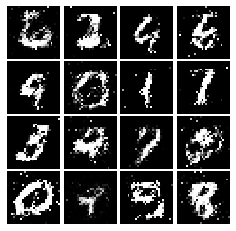

Epoch: 8, Iter: 3960, D: 1.284, G:0.7451


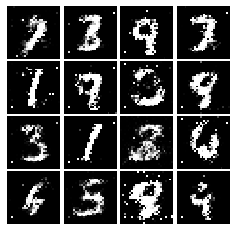

Epoch: 8, Iter: 3980, D: 1.313, G:0.7515


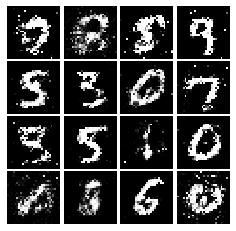

Epoch: 8, Iter: 4000, D: 1.38, G:0.8514


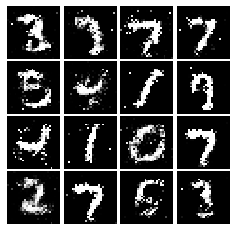

Epoch: 8, Iter: 4020, D: 1.366, G:0.8926


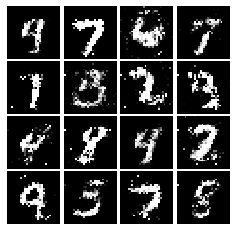

Epoch: 8, Iter: 4040, D: 1.318, G:0.7892


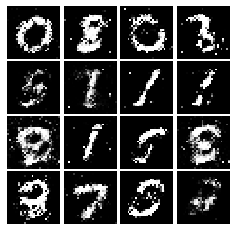

Epoch: 8, Iter: 4060, D: 1.292, G:0.8022


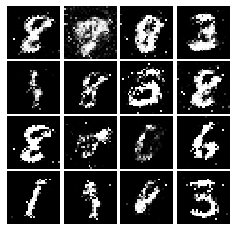

Epoch: 8, Iter: 4080, D: 1.367, G:0.7741


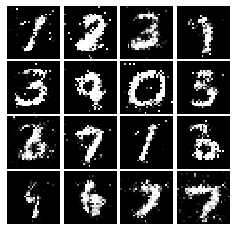

Epoch: 8, Iter: 4100, D: 1.412, G:0.7248


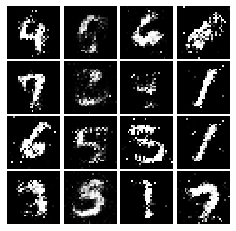

Epoch: 8, Iter: 4120, D: 1.375, G:0.7611


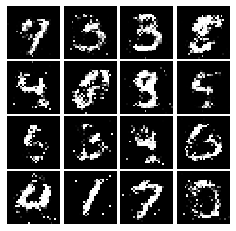

Epoch: 8, Iter: 4140, D: 1.262, G:0.7802


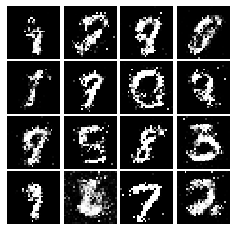

Epoch: 8, Iter: 4160, D: 1.411, G:0.7915


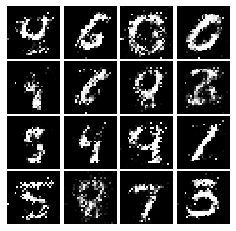

Epoch: 8, Iter: 4180, D: 1.389, G:0.7319


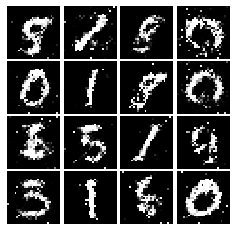

Epoch: 8, Iter: 4200, D: 1.352, G:0.7355


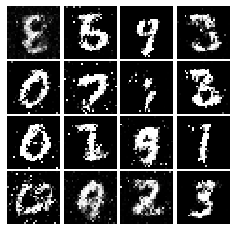

Epoch: 8, Iter: 4220, D: 1.432, G:0.7315


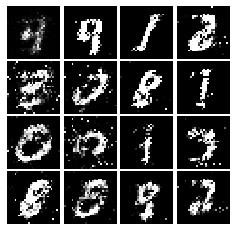

Epoch: 9, Iter: 4240, D: 1.452, G:0.6562


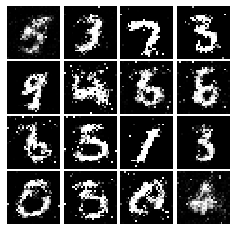

Epoch: 9, Iter: 4260, D: 1.361, G:0.7086


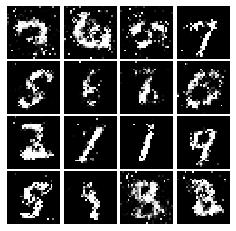

Epoch: 9, Iter: 4280, D: 1.382, G:0.7313


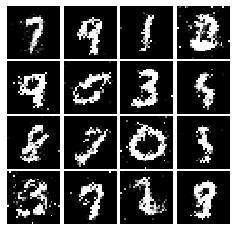

Epoch: 9, Iter: 4300, D: 1.353, G:0.815


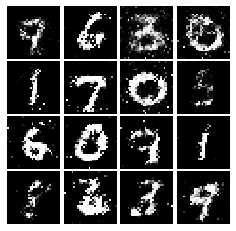

Epoch: 9, Iter: 4320, D: 1.351, G:0.8016


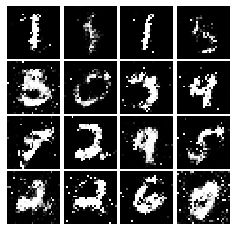

Epoch: 9, Iter: 4340, D: 1.348, G:0.8009


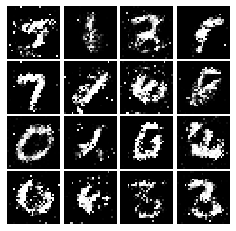

Epoch: 9, Iter: 4360, D: 1.369, G:0.7501


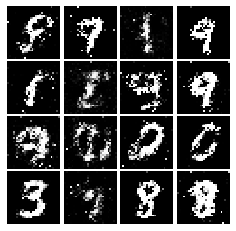

Epoch: 9, Iter: 4380, D: 1.397, G:0.6928


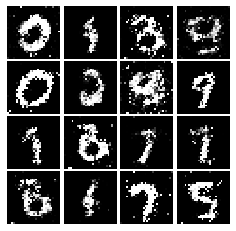

Epoch: 9, Iter: 4400, D: 1.275, G:0.7881


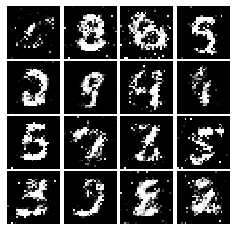

Epoch: 9, Iter: 4420, D: 1.34, G:0.796


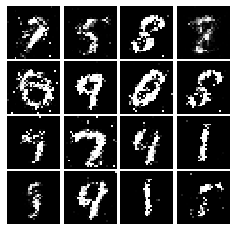

Epoch: 9, Iter: 4440, D: 1.413, G:0.7228


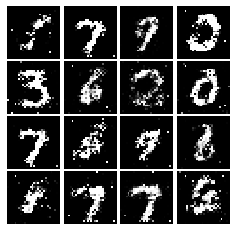

Epoch: 9, Iter: 4460, D: 1.351, G:0.7499


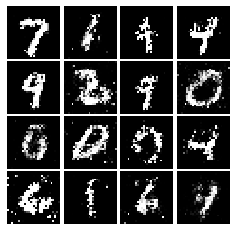

Epoch: 9, Iter: 4480, D: 1.313, G:0.7223


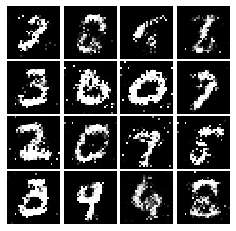

Epoch: 9, Iter: 4500, D: 1.437, G:0.835


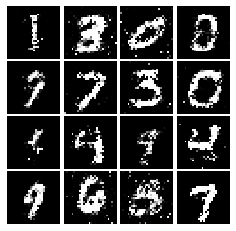

Epoch: 9, Iter: 4520, D: 1.369, G:0.7604


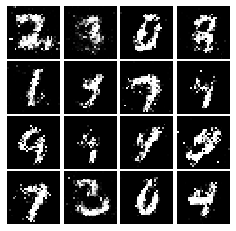

Epoch: 9, Iter: 4540, D: 1.378, G:0.7564


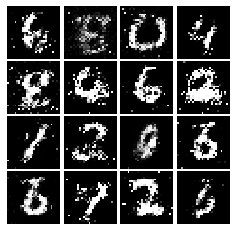

Epoch: 9, Iter: 4560, D: 1.374, G:0.7213


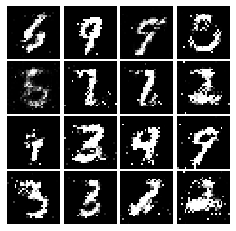

Epoch: 9, Iter: 4580, D: 1.376, G:0.7447


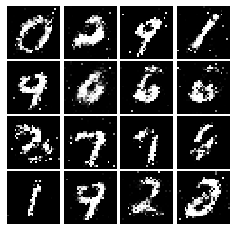

Epoch: 9, Iter: 4600, D: 1.426, G:0.7247


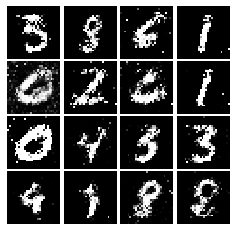

Epoch: 9, Iter: 4620, D: 1.404, G:0.7386


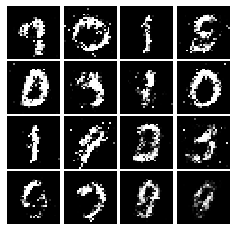

Epoch: 9, Iter: 4640, D: 1.402, G:0.7017


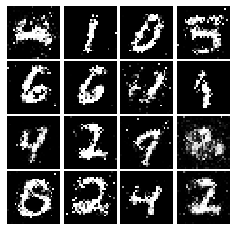

Epoch: 9, Iter: 4660, D: 1.388, G:0.8274


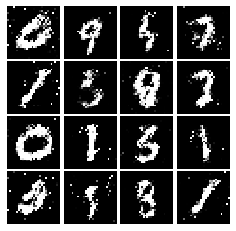

Epoch: 9, Iter: 4680, D: 1.355, G:0.8481


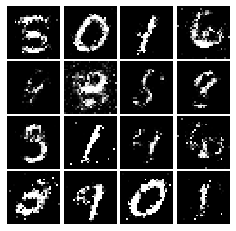

Final images


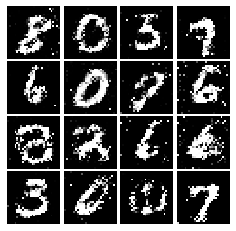

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [0]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_real - 1)**2) + 0.5 * tf.reduce_mean(scores_fake**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - 1)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [22]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.463, G:0.5074


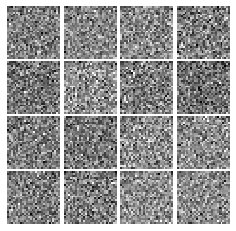

Epoch: 0, Iter: 20, D: 0.02842, G:0.8394


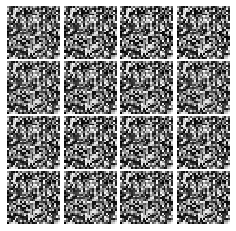

Epoch: 0, Iter: 40, D: 0.2067, G:0.7524


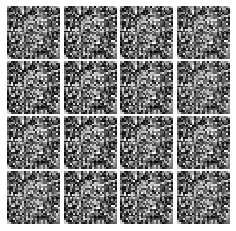

Epoch: 0, Iter: 60, D: 0.07181, G:0.595


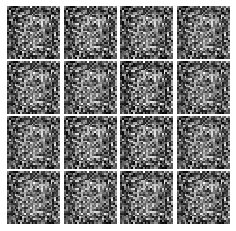

Epoch: 0, Iter: 80, D: 0.123, G:1.528


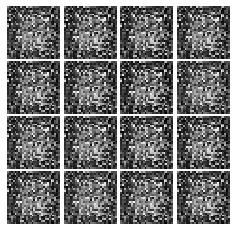

Epoch: 0, Iter: 100, D: 0.04903, G:0.936


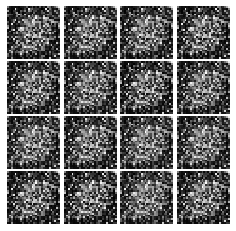

Epoch: 0, Iter: 120, D: 0.1384, G:0.5328


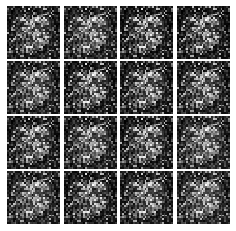

Epoch: 0, Iter: 140, D: 0.1111, G:0.6837


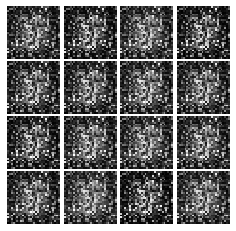

Epoch: 0, Iter: 160, D: 0.1043, G:0.5789


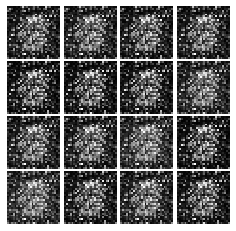

Epoch: 0, Iter: 180, D: 0.461, G:0.4463


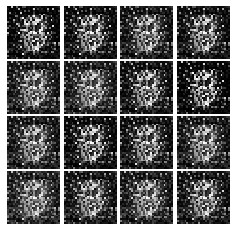

Epoch: 0, Iter: 200, D: 0.1632, G:0.5736


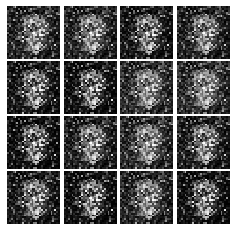

Epoch: 0, Iter: 220, D: 0.4009, G:0.5729


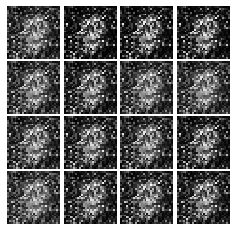

Epoch: 0, Iter: 240, D: 0.1932, G:0.3698


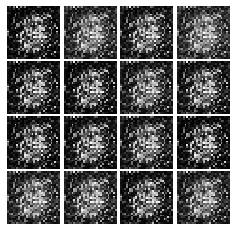

Epoch: 0, Iter: 260, D: 0.2164, G:0.402


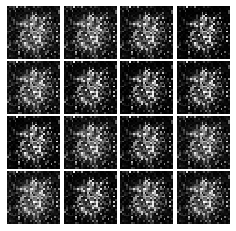

Epoch: 0, Iter: 280, D: 0.1317, G:0.3924


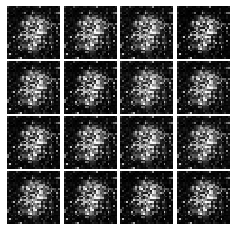

Epoch: 0, Iter: 300, D: 0.09003, G:0.5944


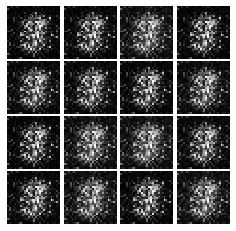

Epoch: 0, Iter: 320, D: 0.1445, G:0.2933


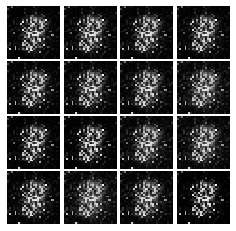

Epoch: 0, Iter: 340, D: 0.1345, G:0.3959


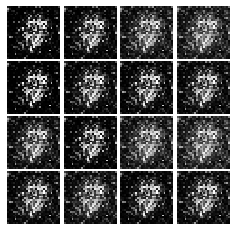

Epoch: 0, Iter: 360, D: 0.1491, G:0.4811


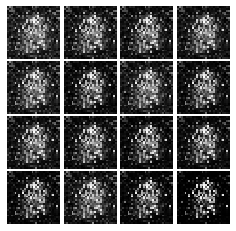

Epoch: 0, Iter: 380, D: 0.1351, G:0.3757


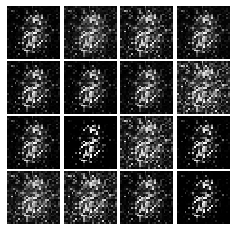

Epoch: 0, Iter: 400, D: 0.1838, G:0.2688


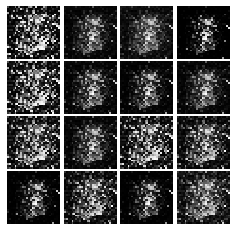

Epoch: 0, Iter: 420, D: 0.1137, G:0.434


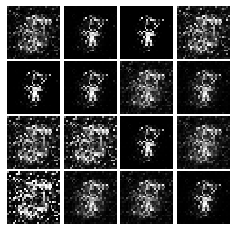

Epoch: 0, Iter: 440, D: 0.1453, G:0.07525


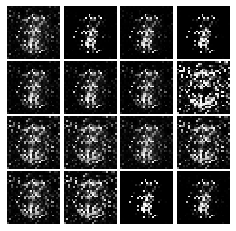

Epoch: 0, Iter: 460, D: 0.1828, G:0.2526


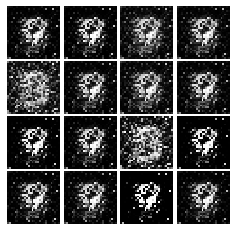

Epoch: 1, Iter: 480, D: 0.5553, G:0.4533


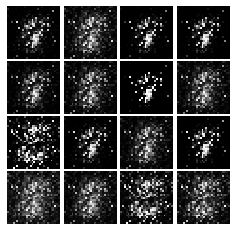

Epoch: 1, Iter: 500, D: 0.1479, G:0.7949


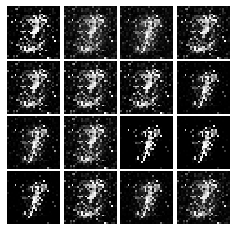

Epoch: 1, Iter: 520, D: 0.1904, G:0.8437


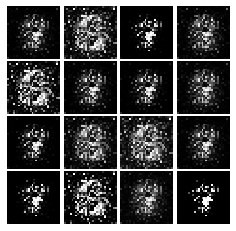

Epoch: 1, Iter: 540, D: 0.1222, G:0.318


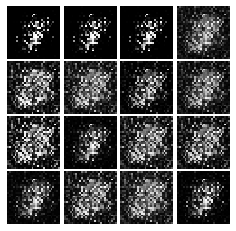

Epoch: 1, Iter: 560, D: 0.05961, G:0.4913


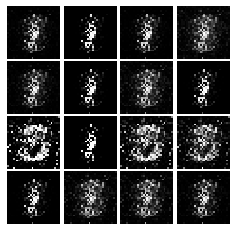

Epoch: 1, Iter: 580, D: 0.122, G:0.3487


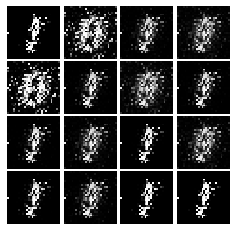

Epoch: 1, Iter: 600, D: 0.144, G:0.3048


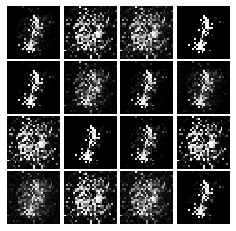

Epoch: 1, Iter: 620, D: 0.1091, G:0.4841


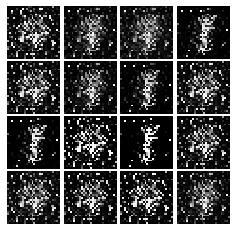

Epoch: 1, Iter: 640, D: 0.07859, G:0.4391


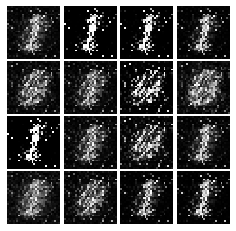

Epoch: 1, Iter: 660, D: 0.1241, G:0.3764


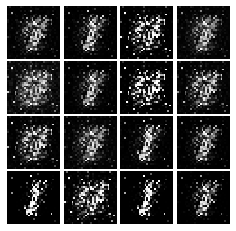

Epoch: 1, Iter: 680, D: 0.15, G:0.4448


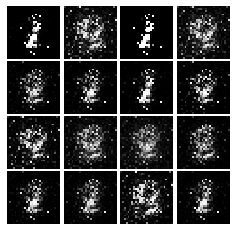

Epoch: 1, Iter: 700, D: 0.1734, G:0.3695


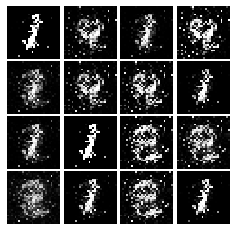

Epoch: 1, Iter: 720, D: 0.2238, G:0.2651


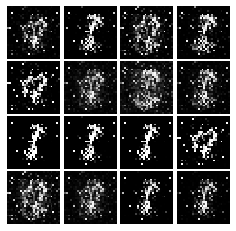

Epoch: 1, Iter: 740, D: 0.1301, G:0.2335


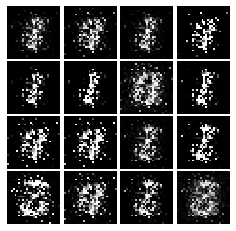

Epoch: 1, Iter: 760, D: 0.1578, G:0.2964


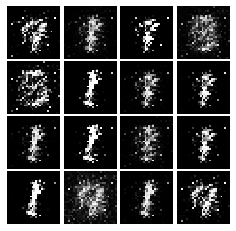

Epoch: 1, Iter: 780, D: 0.1485, G:0.4837


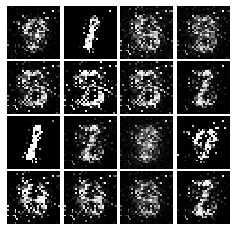

Epoch: 1, Iter: 800, D: 0.1652, G:0.3503


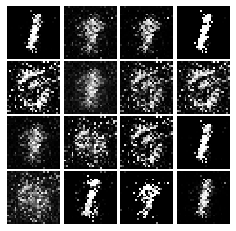

Epoch: 1, Iter: 820, D: 0.143, G:0.4223


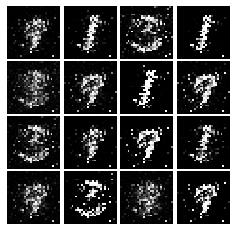

Epoch: 1, Iter: 840, D: 0.09391, G:0.3307


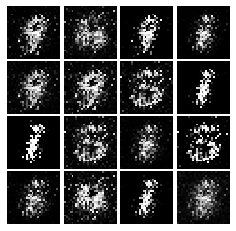

Epoch: 1, Iter: 860, D: 0.1934, G:0.2709


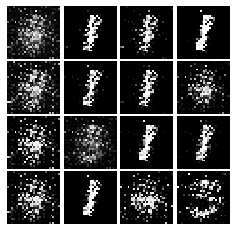

Epoch: 1, Iter: 880, D: 0.2667, G:0.1985


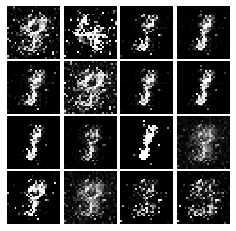

Epoch: 1, Iter: 900, D: 0.115, G:0.3952


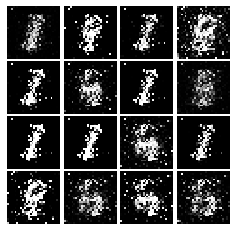

Epoch: 1, Iter: 920, D: 0.1179, G:0.2892


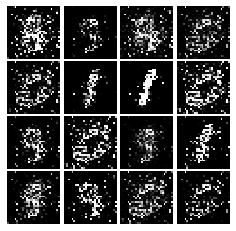

Epoch: 2, Iter: 940, D: 0.2043, G:0.2351


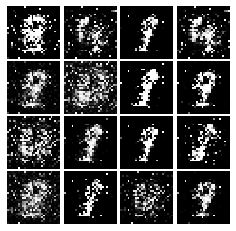

Epoch: 2, Iter: 960, D: 0.1007, G:0.4073


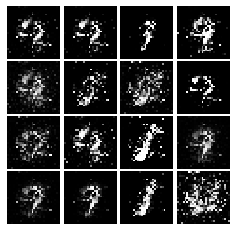

Epoch: 2, Iter: 980, D: 0.1052, G:0.4164


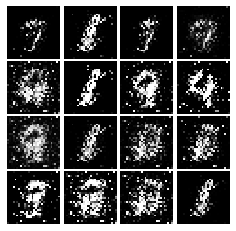

Epoch: 2, Iter: 1000, D: 0.1531, G:0.3263


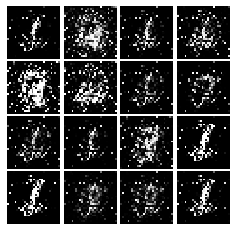

Epoch: 2, Iter: 1020, D: 0.1311, G:0.3004


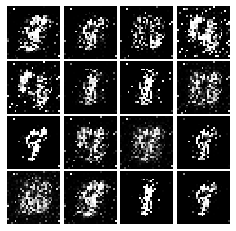

Epoch: 2, Iter: 1040, D: 0.1373, G:0.3624


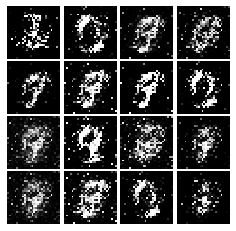

Epoch: 2, Iter: 1060, D: 0.1389, G:0.4719


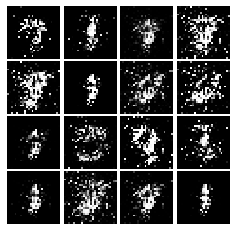

Epoch: 2, Iter: 1080, D: 0.1821, G:0.2656


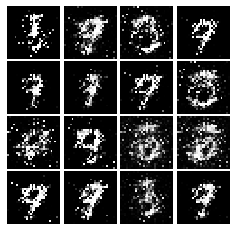

Epoch: 2, Iter: 1100, D: 0.1583, G:0.2603


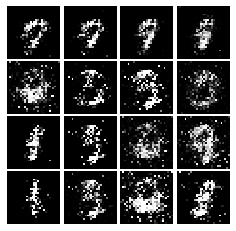

Epoch: 2, Iter: 1120, D: 0.1833, G:0.3926


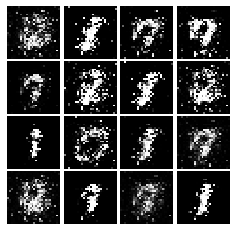

Epoch: 2, Iter: 1140, D: 0.1967, G:0.1795


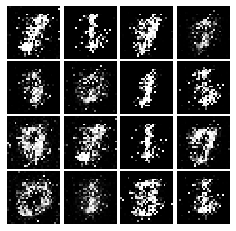

Epoch: 2, Iter: 1160, D: 0.1811, G:0.2787


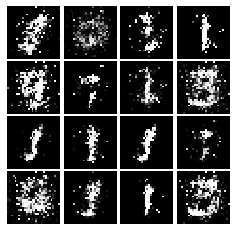

Epoch: 2, Iter: 1180, D: 0.1367, G:0.3419


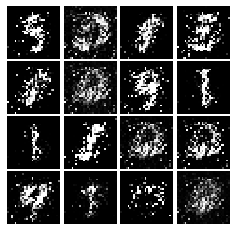

Epoch: 2, Iter: 1200, D: 0.1688, G:0.3092


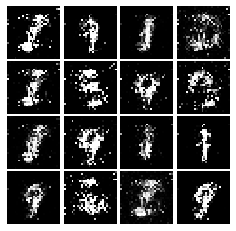

Epoch: 2, Iter: 1220, D: 0.2153, G:0.3015


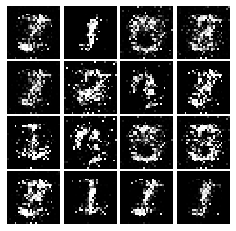

Epoch: 2, Iter: 1240, D: 0.1488, G:0.3811


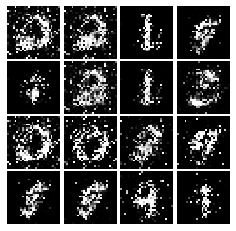

Epoch: 2, Iter: 1260, D: 0.1139, G:0.3639


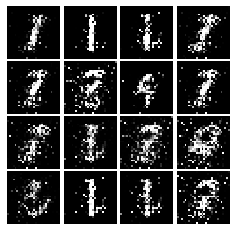

Epoch: 2, Iter: 1280, D: 0.1592, G:0.2513


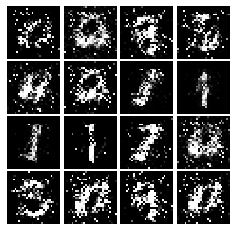

Epoch: 2, Iter: 1300, D: 0.1522, G:0.2751


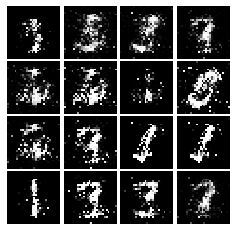

Epoch: 2, Iter: 1320, D: 0.1683, G:0.2519


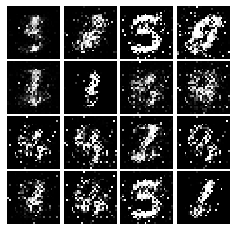

Epoch: 2, Iter: 1340, D: 0.1692, G:0.3684


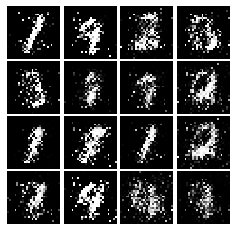

Epoch: 2, Iter: 1360, D: 0.1469, G:0.3005


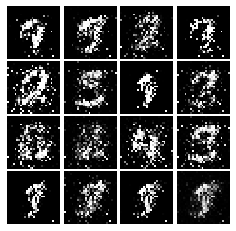

Epoch: 2, Iter: 1380, D: 0.1294, G:0.3102


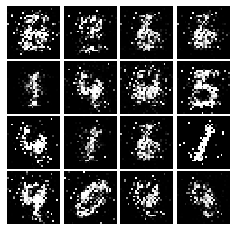

Epoch: 2, Iter: 1400, D: 0.1642, G:0.2314


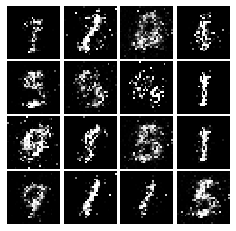

Epoch: 3, Iter: 1420, D: 0.2058, G:0.2246


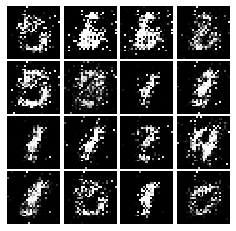

Epoch: 3, Iter: 1440, D: 0.1692, G:0.2742


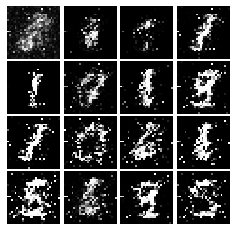

Epoch: 3, Iter: 1460, D: 0.163, G:0.1893


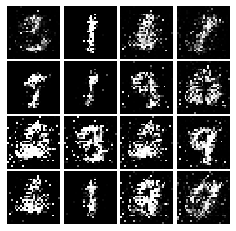

Epoch: 3, Iter: 1480, D: 0.1749, G:0.2457


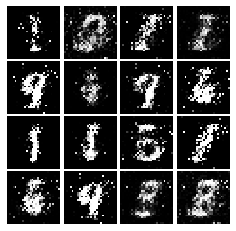

Epoch: 3, Iter: 1500, D: 0.1803, G:0.2174


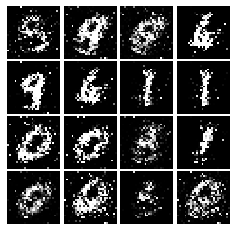

Epoch: 3, Iter: 1520, D: 0.195, G:0.2244


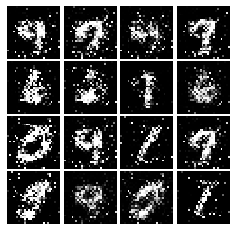

Epoch: 3, Iter: 1540, D: 0.1677, G:0.2709


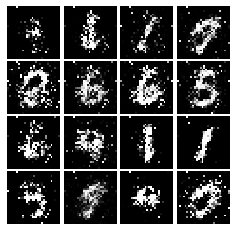

Epoch: 3, Iter: 1560, D: 0.18, G:0.3684


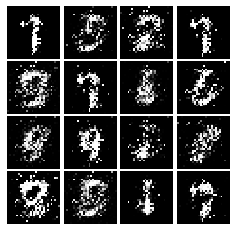

Epoch: 3, Iter: 1580, D: 0.1531, G:0.2792


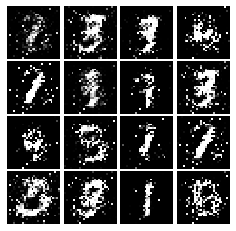

Epoch: 3, Iter: 1600, D: 0.2013, G:0.2481


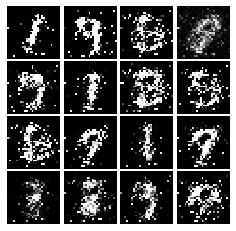

Epoch: 3, Iter: 1620, D: 0.1596, G:0.3437


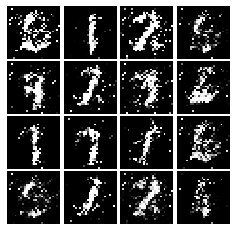

Epoch: 3, Iter: 1640, D: 0.2086, G:0.2651


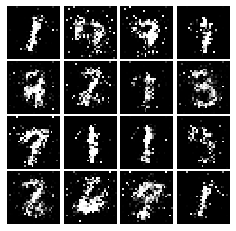

Epoch: 3, Iter: 1660, D: 0.1688, G:0.209


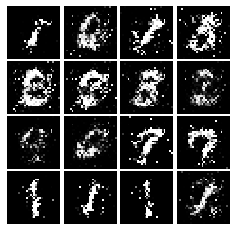

Epoch: 3, Iter: 1680, D: 0.1794, G:0.2623


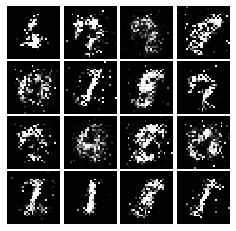

Epoch: 3, Iter: 1700, D: 0.1826, G:0.3099


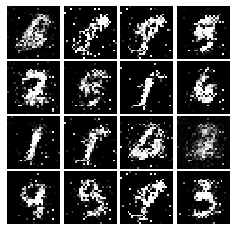

Epoch: 3, Iter: 1720, D: 0.2112, G:0.2332


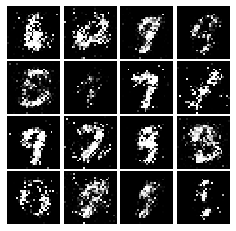

Epoch: 3, Iter: 1740, D: 0.2066, G:0.1982


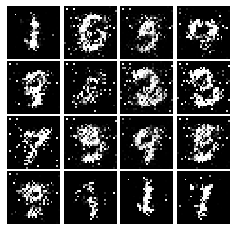

Epoch: 3, Iter: 1760, D: 0.1793, G:0.2573


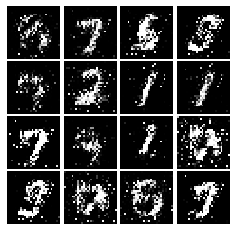

Epoch: 3, Iter: 1780, D: 0.1884, G:0.2469


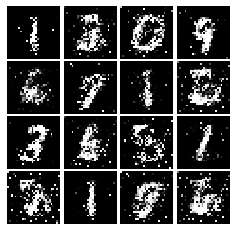

Epoch: 3, Iter: 1800, D: 0.211, G:0.2288


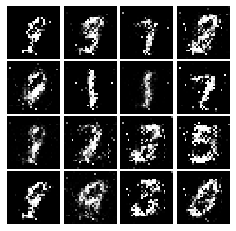

Epoch: 3, Iter: 1820, D: 0.228, G:0.1738


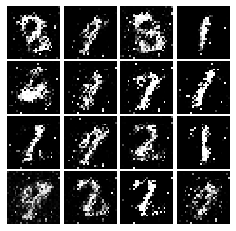

Epoch: 3, Iter: 1840, D: 0.1994, G:0.2525


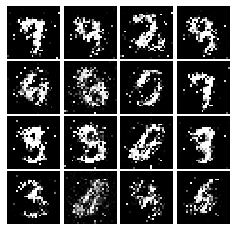

Epoch: 3, Iter: 1860, D: 0.2013, G:0.1668


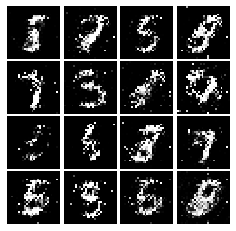

Epoch: 4, Iter: 1880, D: 0.2148, G:0.2429


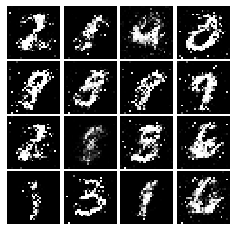

Epoch: 4, Iter: 1900, D: 0.2012, G:0.2155


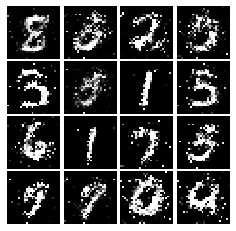

Epoch: 4, Iter: 1920, D: 0.2127, G:0.2102


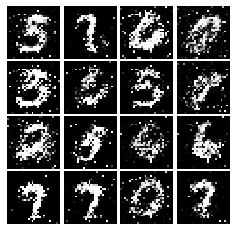

Epoch: 4, Iter: 1940, D: 0.205, G:0.2757


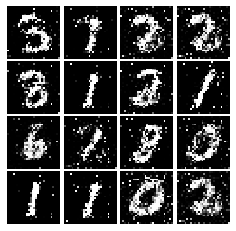

Epoch: 4, Iter: 1960, D: 0.2123, G:0.2515


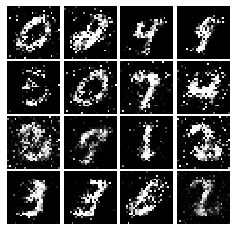

Epoch: 4, Iter: 1980, D: 0.1891, G:0.2966


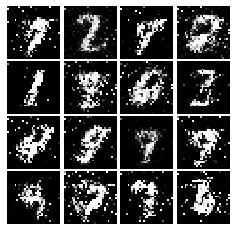

Epoch: 4, Iter: 2000, D: 0.2263, G:0.2004


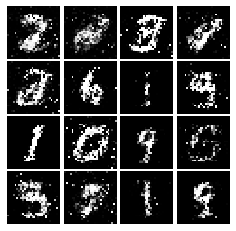

Epoch: 4, Iter: 2020, D: 0.2356, G:0.1785


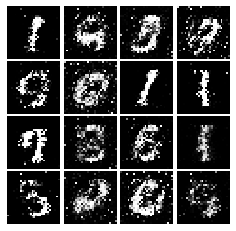

Epoch: 4, Iter: 2040, D: 0.2084, G:0.2111


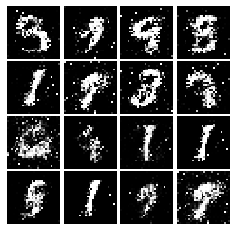

Epoch: 4, Iter: 2060, D: 0.2351, G:0.1782


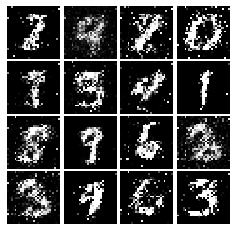

Epoch: 4, Iter: 2080, D: 0.2167, G:0.1945


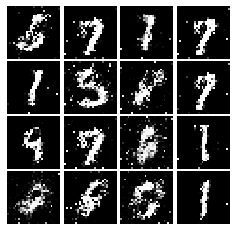

Epoch: 4, Iter: 2100, D: 0.224, G:0.2033


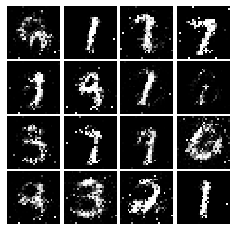

Epoch: 4, Iter: 2120, D: 0.2435, G:0.1997


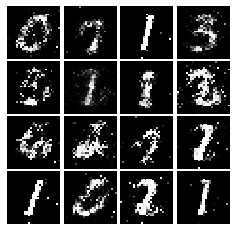

Epoch: 4, Iter: 2140, D: 0.2123, G:0.1662


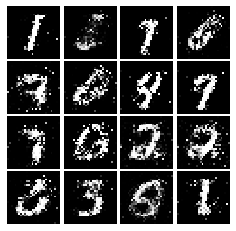

Epoch: 4, Iter: 2160, D: 0.2306, G:0.1753


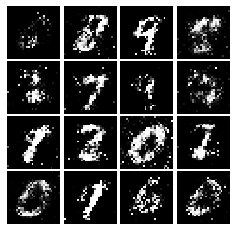

Epoch: 4, Iter: 2180, D: 0.2039, G:0.1766


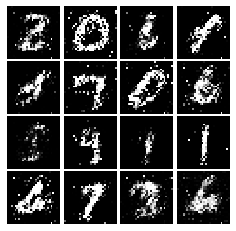

Epoch: 4, Iter: 2200, D: 0.1942, G:0.1798


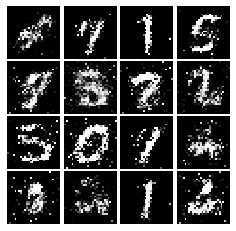

Epoch: 4, Iter: 2220, D: 0.2053, G:0.203


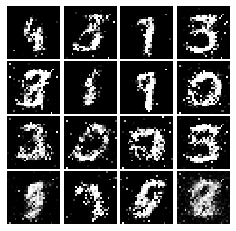

Epoch: 4, Iter: 2240, D: 0.1976, G:0.1922


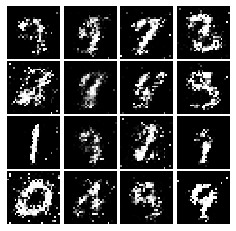

Epoch: 4, Iter: 2260, D: 0.2155, G:0.2159


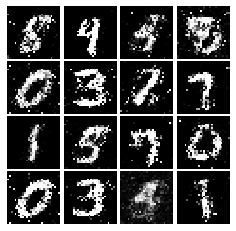

Epoch: 4, Iter: 2280, D: 0.2029, G:0.1866


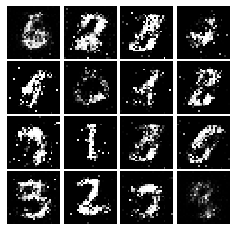

Epoch: 4, Iter: 2300, D: 0.2095, G:0.1969


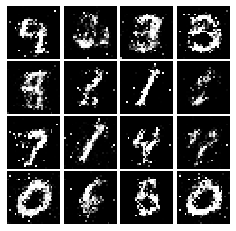

Epoch: 4, Iter: 2320, D: 0.1857, G:0.2338


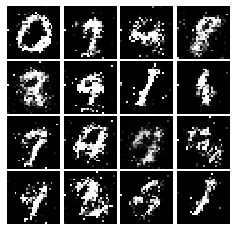

Epoch: 4, Iter: 2340, D: 0.1965, G:0.2337


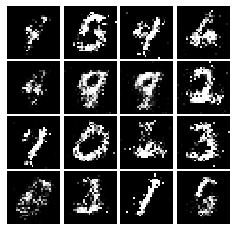

Epoch: 5, Iter: 2360, D: 0.2537, G:0.232


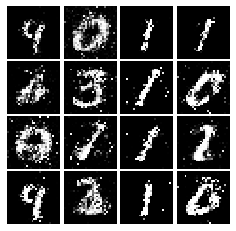

Epoch: 5, Iter: 2380, D: 0.2088, G:0.2


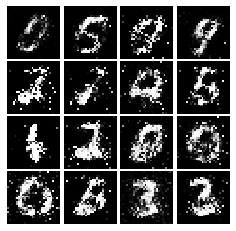

Epoch: 5, Iter: 2400, D: 0.2139, G:0.1782


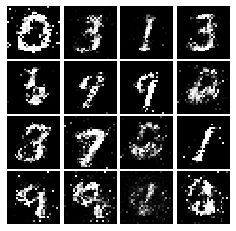

Epoch: 5, Iter: 2420, D: 0.1924, G:0.2207


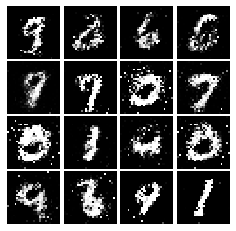

Epoch: 5, Iter: 2440, D: 0.2363, G:0.1709


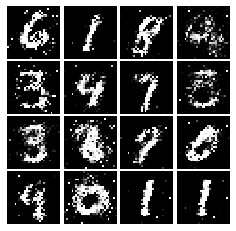

Epoch: 5, Iter: 2460, D: 0.1836, G:0.1839


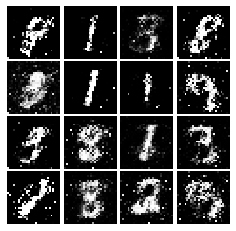

Epoch: 5, Iter: 2480, D: 0.2267, G:0.1906


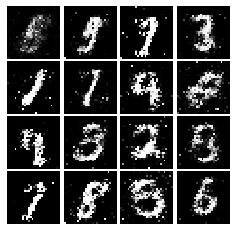

Epoch: 5, Iter: 2500, D: 0.1839, G:0.2107


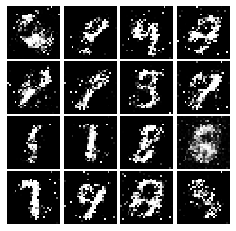

Epoch: 5, Iter: 2520, D: 0.2491, G:0.1972


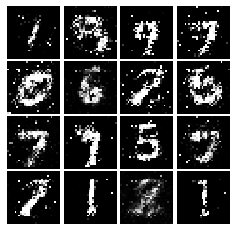

Epoch: 5, Iter: 2540, D: 0.2131, G:0.1886


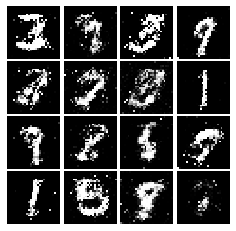

Epoch: 5, Iter: 2560, D: 0.2208, G:0.1922


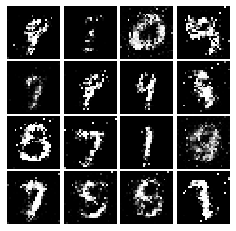

Epoch: 5, Iter: 2580, D: 0.2008, G:0.2083


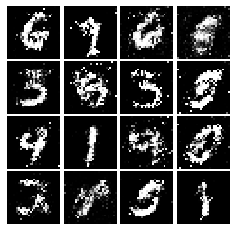

Epoch: 5, Iter: 2600, D: 0.2258, G:0.161


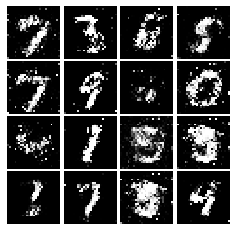

Epoch: 5, Iter: 2620, D: 0.2245, G:0.1719


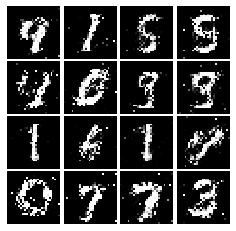

Epoch: 5, Iter: 2640, D: 0.2158, G:0.1805


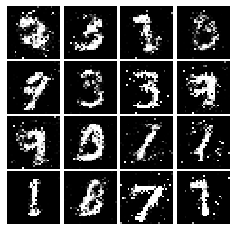

Epoch: 5, Iter: 2660, D: 0.2166, G:0.1681


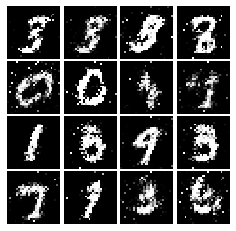

Epoch: 5, Iter: 2680, D: 0.2498, G:0.1954


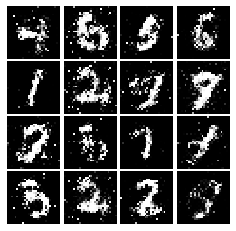

Epoch: 5, Iter: 2700, D: 0.2193, G:0.1962


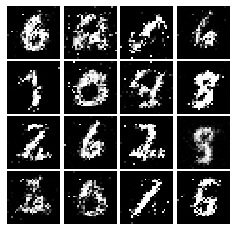

Epoch: 5, Iter: 2720, D: 0.209, G:0.1938


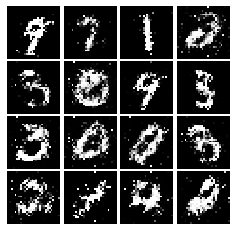

Epoch: 5, Iter: 2740, D: 0.2163, G:0.1718


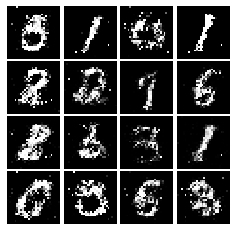

Epoch: 5, Iter: 2760, D: 0.1961, G:0.1997


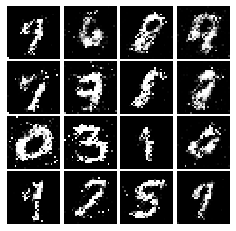

Epoch: 5, Iter: 2780, D: 0.214, G:0.1765


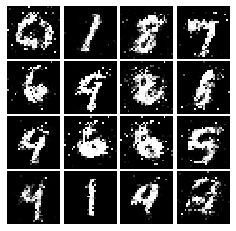

Epoch: 5, Iter: 2800, D: 0.1819, G:0.2284


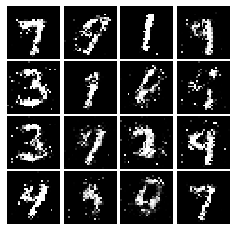

Epoch: 6, Iter: 2820, D: 0.2235, G:0.1705


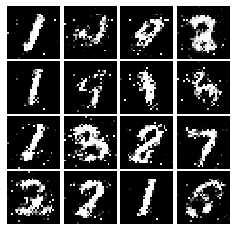

Epoch: 6, Iter: 2840, D: 0.194, G:0.1897


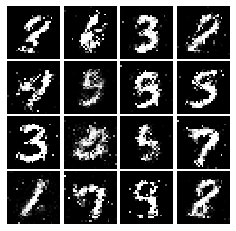

Epoch: 6, Iter: 2860, D: 0.1875, G:0.2286


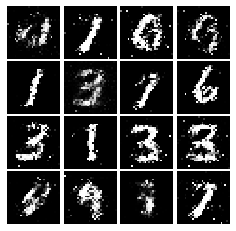

Epoch: 6, Iter: 2880, D: 0.1924, G:0.2911


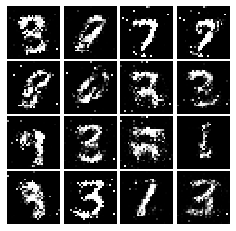

Epoch: 6, Iter: 2900, D: 0.2189, G:0.1966


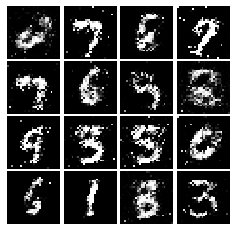

Epoch: 6, Iter: 2920, D: 0.2579, G:0.1894


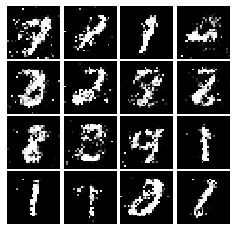

Epoch: 6, Iter: 2940, D: 0.218, G:0.1746


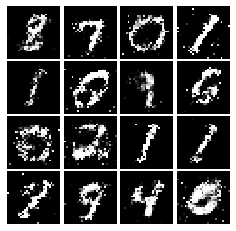

Epoch: 6, Iter: 2960, D: 0.2091, G:0.197


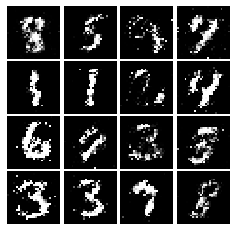

Epoch: 6, Iter: 2980, D: 0.2252, G:0.1813


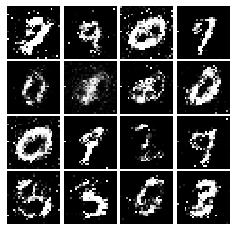

Epoch: 6, Iter: 3000, D: 0.2076, G:0.1599


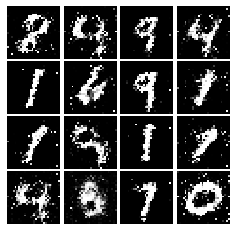

Epoch: 6, Iter: 3020, D: 0.2135, G:0.2236


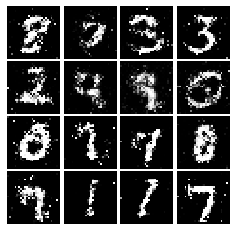

Epoch: 6, Iter: 3040, D: 0.2093, G:0.2012


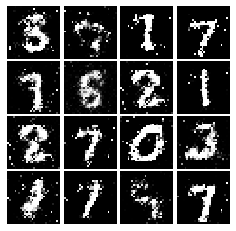

Epoch: 6, Iter: 3060, D: 0.2192, G:0.1677


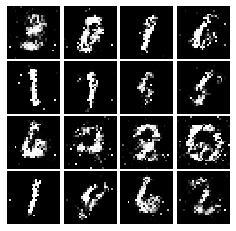

Epoch: 6, Iter: 3080, D: 0.2172, G:0.1716


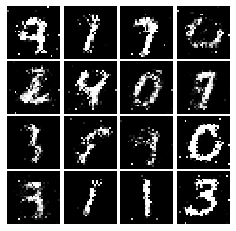

Epoch: 6, Iter: 3100, D: 0.199, G:0.2112


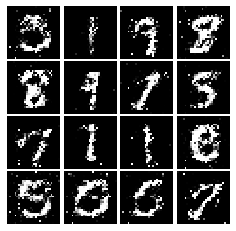

Epoch: 6, Iter: 3120, D: 0.1971, G:0.204


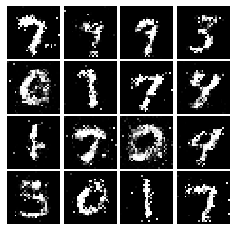

Epoch: 6, Iter: 3140, D: 0.2166, G:0.1767


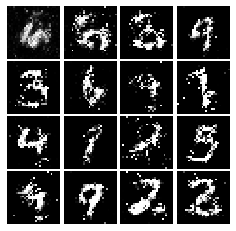

Epoch: 6, Iter: 3160, D: 0.2149, G:0.1821


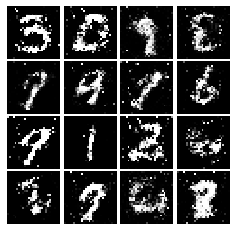

Epoch: 6, Iter: 3180, D: 0.2098, G:0.1945


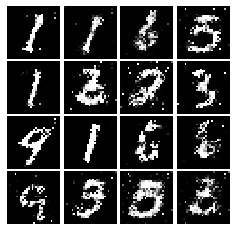

Epoch: 6, Iter: 3200, D: 0.2189, G:0.1554


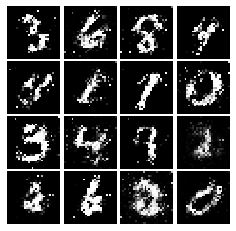

Epoch: 6, Iter: 3220, D: 0.2022, G:0.2018


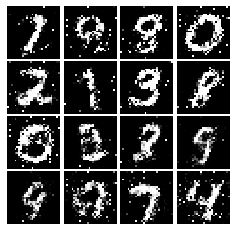

Epoch: 6, Iter: 3240, D: 0.2288, G:0.1607


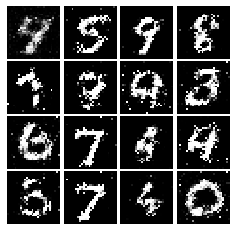

Epoch: 6, Iter: 3260, D: 0.2232, G:0.1869


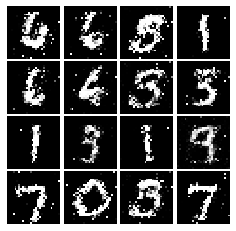

Epoch: 6, Iter: 3280, D: 0.2332, G:0.2127


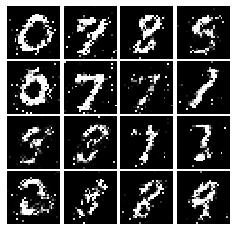

Epoch: 7, Iter: 3300, D: 0.2084, G:0.1954


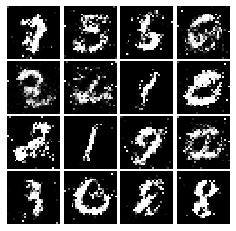

Epoch: 7, Iter: 3320, D: 0.1779, G:0.1939


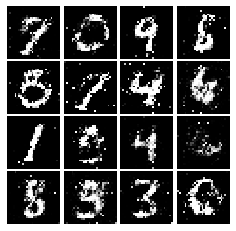

Epoch: 7, Iter: 3340, D: 0.2254, G:0.1936


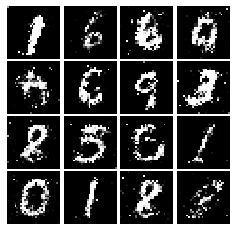

Epoch: 7, Iter: 3360, D: 0.2353, G:0.1849


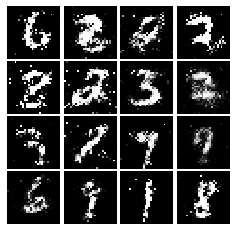

Epoch: 7, Iter: 3380, D: 0.2101, G:0.1845


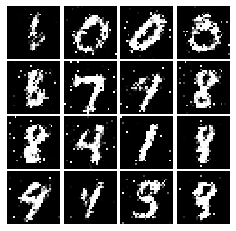

Epoch: 7, Iter: 3400, D: 0.2501, G:0.155


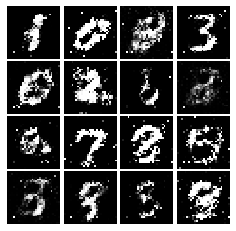

Epoch: 7, Iter: 3420, D: 0.2257, G:0.1663


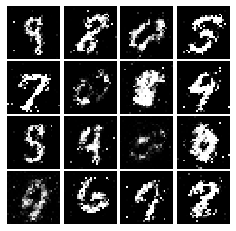

Epoch: 7, Iter: 3440, D: 0.228, G:0.1923


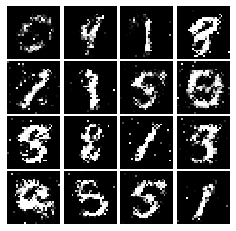

Epoch: 7, Iter: 3460, D: 0.2183, G:0.1807


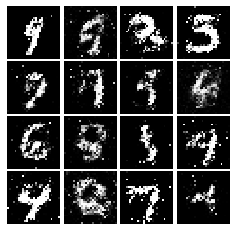

Epoch: 7, Iter: 3480, D: 0.2085, G:0.175


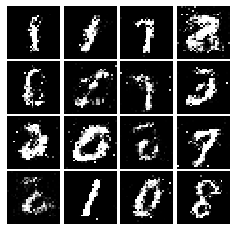

Epoch: 7, Iter: 3500, D: 0.2347, G:0.1731


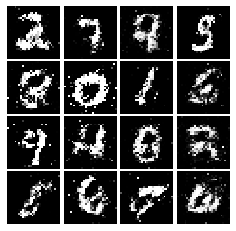

Epoch: 7, Iter: 3520, D: 0.215, G:0.1859


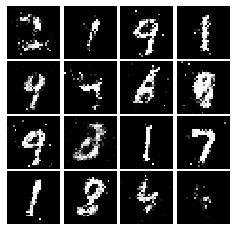

Epoch: 7, Iter: 3540, D: 0.2015, G:0.1781


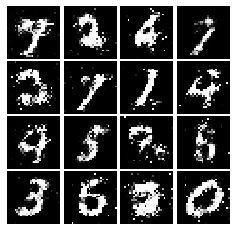

Epoch: 7, Iter: 3560, D: 0.2102, G:0.1906


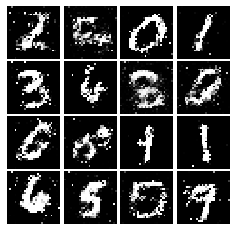

Epoch: 7, Iter: 3580, D: 0.2164, G:0.1628


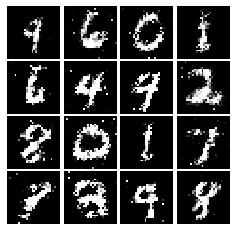

Epoch: 7, Iter: 3600, D: 0.2276, G:0.1719


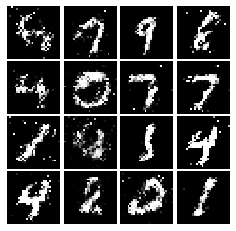

Epoch: 7, Iter: 3620, D: 0.2186, G:0.1604


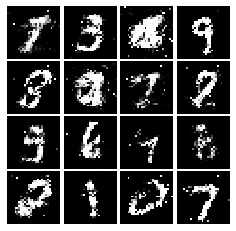

Epoch: 7, Iter: 3640, D: 0.2213, G:0.1659


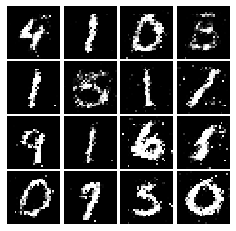

Epoch: 7, Iter: 3660, D: 0.2189, G:0.1767


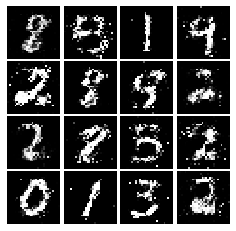

Epoch: 7, Iter: 3680, D: 0.242, G:0.1881


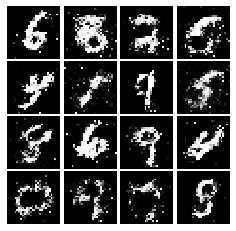

Epoch: 7, Iter: 3700, D: 0.2149, G:0.1646


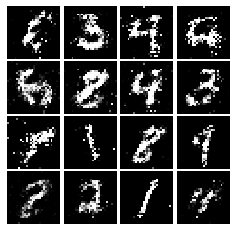

Epoch: 7, Iter: 3720, D: 0.2125, G:0.1832


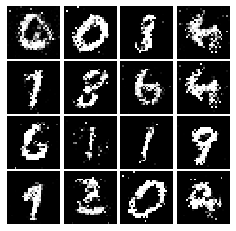

Epoch: 7, Iter: 3740, D: 0.2171, G:0.1904


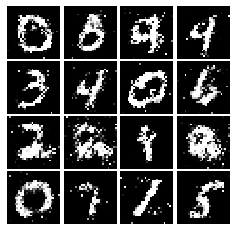

Epoch: 8, Iter: 3760, D: 0.2097, G:0.2144


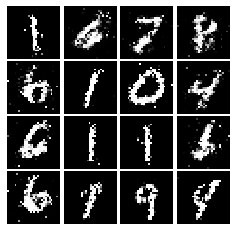

Epoch: 8, Iter: 3780, D: 0.256, G:0.185


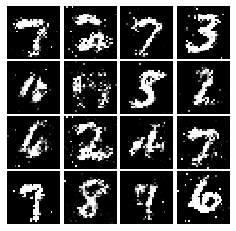

Epoch: 8, Iter: 3800, D: 0.2531, G:0.1792


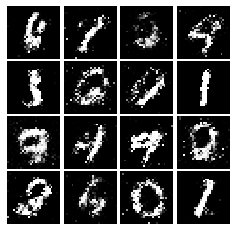

Epoch: 8, Iter: 3820, D: 0.226, G:0.1507


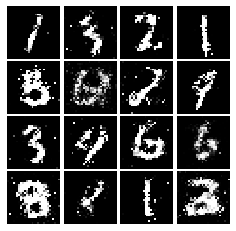

Epoch: 8, Iter: 3840, D: 0.2307, G:0.1864


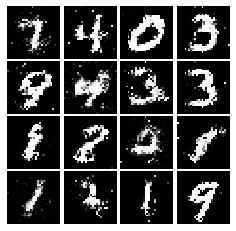

Epoch: 8, Iter: 3860, D: 0.2122, G:0.1695


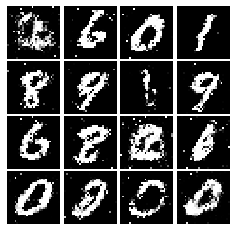

Epoch: 8, Iter: 3880, D: 0.2189, G:0.1655


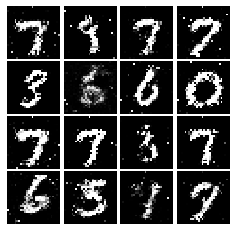

Epoch: 8, Iter: 3900, D: 0.2096, G:0.1692


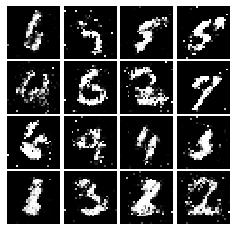

Epoch: 8, Iter: 3920, D: 0.1961, G:0.1855


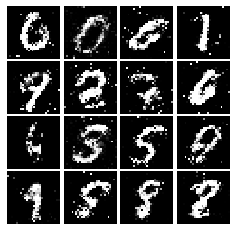

Epoch: 8, Iter: 3940, D: 0.2418, G:0.169


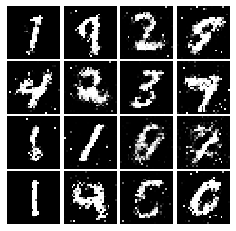

Epoch: 8, Iter: 3960, D: 0.2238, G:0.1649


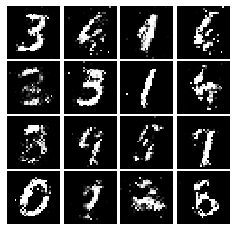

Epoch: 8, Iter: 3980, D: 0.211, G:0.1985


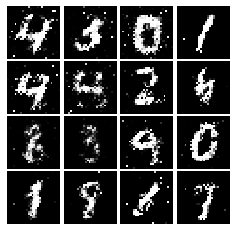

Epoch: 8, Iter: 4000, D: 0.2282, G:0.186


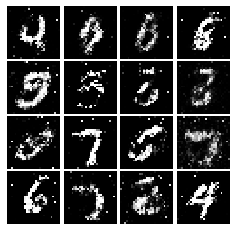

Epoch: 8, Iter: 4020, D: 0.2296, G:0.1794


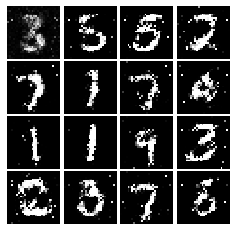

Epoch: 8, Iter: 4040, D: 0.2259, G:0.1628


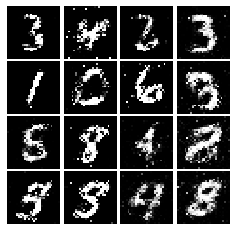

Epoch: 8, Iter: 4060, D: 0.2197, G:0.2062


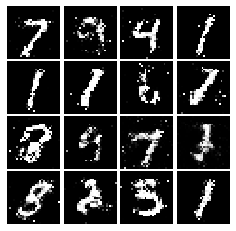

Epoch: 8, Iter: 4080, D: 0.2422, G:0.1839


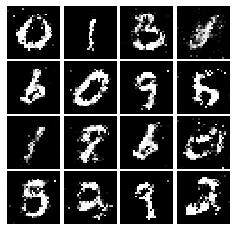

Epoch: 8, Iter: 4100, D: 0.2167, G:0.1758


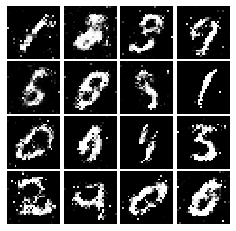

Epoch: 8, Iter: 4120, D: 0.2261, G:0.1586


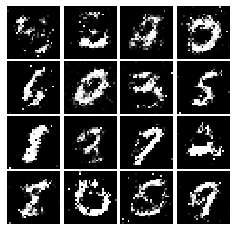

Epoch: 8, Iter: 4140, D: 0.2051, G:0.1796


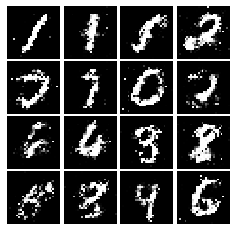

Epoch: 8, Iter: 4160, D: 0.2171, G:0.1724


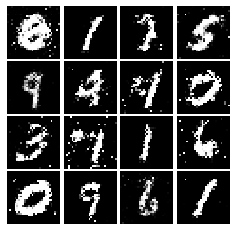

Epoch: 8, Iter: 4180, D: 0.2284, G:0.159


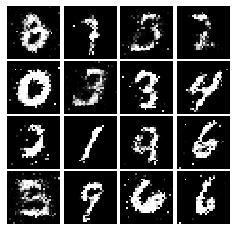

Epoch: 8, Iter: 4200, D: 0.2181, G:0.1916


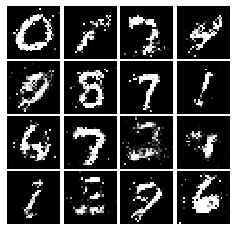

Epoch: 8, Iter: 4220, D: 0.2286, G:0.1825


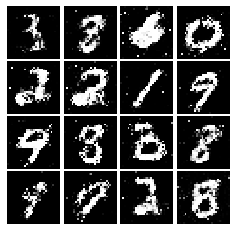

Epoch: 9, Iter: 4240, D: 0.233, G:0.185


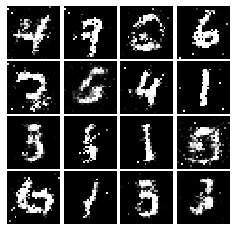

Epoch: 9, Iter: 4260, D: 0.24, G:0.1608


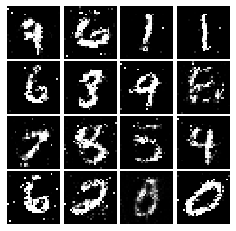

Epoch: 9, Iter: 4280, D: 0.2146, G:0.192


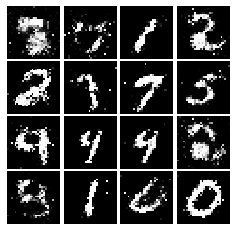

Epoch: 9, Iter: 4300, D: 0.2583, G:0.1543


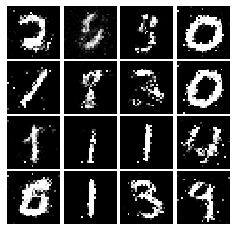

Epoch: 9, Iter: 4320, D: 0.2298, G:0.1582


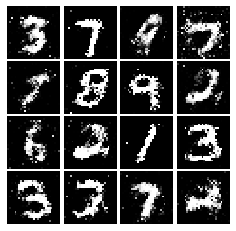

Epoch: 9, Iter: 4340, D: 0.2539, G:0.1862


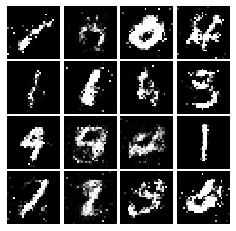

Epoch: 9, Iter: 4360, D: 0.2321, G:0.1745


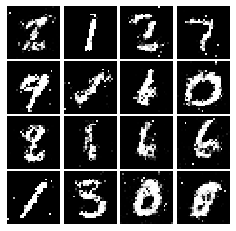

Epoch: 9, Iter: 4380, D: 0.2407, G:0.1603


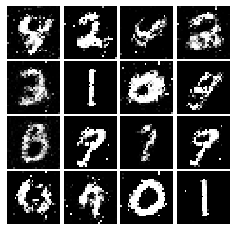

Epoch: 9, Iter: 4400, D: 0.2169, G:0.1743


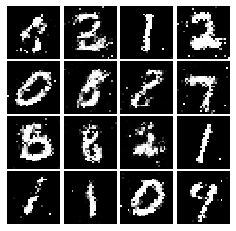

Epoch: 9, Iter: 4420, D: 0.2268, G:0.1782


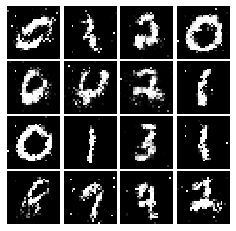

Epoch: 9, Iter: 4440, D: 0.2288, G:0.1398


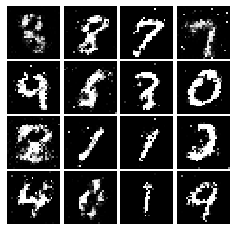

Epoch: 9, Iter: 4460, D: 0.2287, G:0.1858


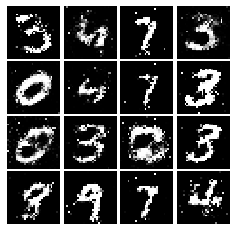

Epoch: 9, Iter: 4480, D: 0.1981, G:0.1588


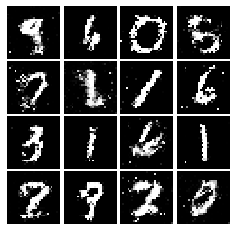

Epoch: 9, Iter: 4500, D: 0.2565, G:0.1671


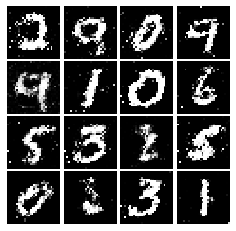

Epoch: 9, Iter: 4520, D: 0.224, G:0.2169


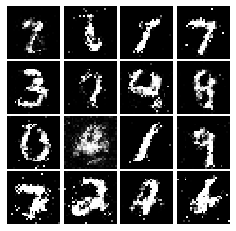

Epoch: 9, Iter: 4540, D: 0.2282, G:0.167


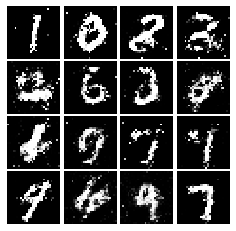

Epoch: 9, Iter: 4560, D: 0.2228, G:0.1886


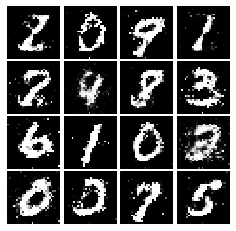

Epoch: 9, Iter: 4580, D: 0.2312, G:0.1748


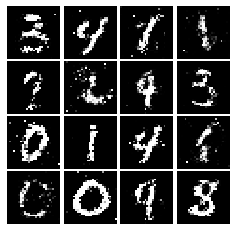

Epoch: 9, Iter: 4600, D: 0.2482, G:0.1568


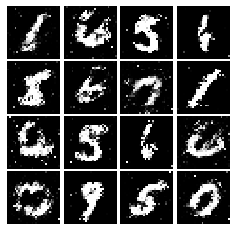

Epoch: 9, Iter: 4620, D: 0.2326, G:0.1745


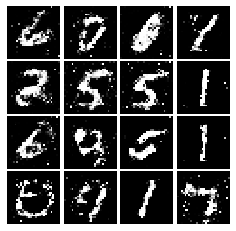

Epoch: 9, Iter: 4640, D: 0.2288, G:0.1703


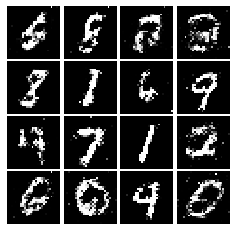

Epoch: 9, Iter: 4660, D: 0.2261, G:0.1726


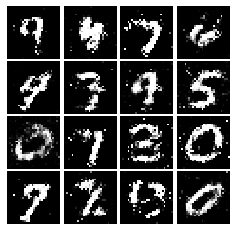

Epoch: 9, Iter: 4680, D: 0.2483, G:0.1385


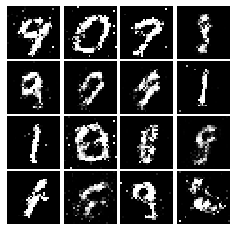

Final images


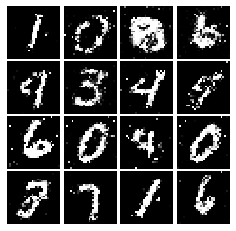

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [40]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Reshape((28,28,1)))
    print(1)
    model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=5, activation=leaky_relu))
    print(2)
    model.add(tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
    print(3)
    model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=5, activation=leaky_relu))
    print(4)
    model.add(tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
    print(5)
    model.add(tf.keras.layers.Flatten())
    print(6)
    model.add(tf.keras.layers.Dense(4*4*64,activation=leaky_relu))
    print(7)
    model.add(tf.keras.layers.Dense(1,activation=None))
    print(8)
    model.build((None, 784))
    return model

model = discriminator()
test_discriminator(1102721)

1
2
3
4
5
6
7
8
1
2
3
4
5
6
7
8
Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [41]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    model.add(tf.keras.layers.Dense(1024,activation=tf.nn.relu))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(7*7*128,activation=tf.nn.relu))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7,7,128)))
    model.add(tf.keras.layers.Conv2DTranspose(64,4,(2,2),activation=tf.nn.relu))
    model.add(tf.keras.layers.BatchNormalization())
    model.add( tf.keras.layers.Conv2DTranspose(1,4,(2,2),activation=tf.nn.tanh))
    model.add(tf.keras.layers.Flatten())

    model.build((None,noise_dim))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer:
No, It's means that the discriminator not doing it's job good enough, thus the generator won't learn correct answers
